In [2]:
import os,sys
sys.path.append(os.path.dirname(os.getcwd()))
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [3]:
from functools import partial
from typing import Any, Sequence

# activate TPUs if available
try:
    import jax.tools.colab_tpu
    jax.tools.colab_tpu.setup_tpu()
except (KeyError, RuntimeError):
    print("TPU not found, continuing without it.")

from jax import config
config.update("jax_enable_x64", True)

import jax
from jax import numpy as jnp
from jax import random
from jax import vmap
from jax.tree_util import Partial, tree_map

from jaxopt import LBFGS, GradientDescent
from jaxopt import linear_solve
from jaxopt import OptaxSolver
from jaxopt import tree_util

import optax

# we use flax to construct a small multi-layer perceptron
from flax import linen as nn
from tqdm.auto import tqdm

# for plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm

TPU not found, continuing without it.


In [4]:
# import scienceplots
# plt.style.use(["science", "grid"])
%matplotlib inline

# Default setting
import matplotlib as mpl
import matplotlib
# import seaborn as sns
from matplotlib import cm
from cycler import cycler

# mpl.rcParams['axes.prop_cycle'] = cycler(color='brgcmyk')
# grid setting
plt.rcParams['axes.grid'] = False
plt.rcParams['grid.color'] = '#808080'
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.linewidth'] = 0.5

# graph font size
# mpl.rcParams['font.size'] = 16
mpl.rcParams['legend.fontsize'] = 16
mpl.rcParams['figure.titlesize'] = 18
mpl.rcParams['axes.titlesize'] = 18
mpl.rcParams['lines.linewidth'] = 2.0
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14

# tight axis
plt.rcParams['axes.xmargin'] = 0

# figure size
plt.rcParams["figure.figsize"] = (6.4, 4.8)

# LaTeX
plt.rcParams['text.usetex'] = False
plt.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['pdf.fonttype'] = 42 # For TrueType fonts


In [5]:
import jax.numpy as jnp
import jax
import pickle
import time
from jax import hessian, jacobian, jit, vmap, grad, random, value_and_grad
from functools import partial
import diffrax
from typing import Callable, Optional, Union
from flax import linen as nn
from flax.training.train_state import TrainState
import optax
from jax_md.quantity import force
import equinox as eqx
from tqdm import trange, tqdm

In [6]:
from blockymetamaterials.utils import SolutionType, SolutionData, ControlParams, GeometricalParams, MechanicalParams, LigamentParams, ContactParams
from blockymetamaterials.geometry import Geometry, QuadGeometry, compute_inertia, compute_edge_angles, compute_edge_lengths, DOFsInfo, QuadGeometry_InputSource
from blockymetamaterials.energy import build_strain_energy, kinetic_energy, ligament_energy, ligament_energy_linearized, build_contact_energy, combine_block_energies, compute_ligament_strains_history, constrain_energy
from typing import Any, Literal, Optional, List, Union, Tuple, Dict
import dataclasses
from dataclasses import dataclass
from itertools import combinations
from cooptimization_real import setup_dynamic_solver, setup_dynamic_solver_all


In [6]:
color_list = ["#2980b9", "#e74c3c", "#00a043", "#793693", "#f1c40f","#fb9206"]

In [7]:
class minmax_scaler():
  def __init__(self, input_data, output_data):
    # assume that 
    self.data_max = jnp.max(input_data, axis=(0, 1), keepdims=True)
    self.data_min = jnp.min(input_data, axis=(0, 1), keepdims=True)
    print(self.data_max.shape, self.data_min.shape)

    self.output_data_max = jnp.max(output_data, axis=(0, 1), keepdims=True)
    self.output_data_min = jnp.min(output_data, axis=(0, 1), keepdims=True)
    print(self.output_data_max.shape, self.output_data_min.shape)

  def transform(self, input_data, output_data):
    data_normalized = 2.0 * ( input_data - self.data_min ) / ( self.data_max - self.data_min ) - 1.0  # Add a small value to avoid division by zero
    output_normalized = (output_data - self.output_data_min) / (self.output_data_max - self.output_data_min)
    return data_normalized, output_normalized
  
  def inverse_transform(self, data_normalized, output_normalized):
    data_original = (data_normalized + 1.0) * (self.data_max - self.data_min) / 2.0 + self.data_min
    output_original = output_normalized * (self.output_data_max - self.output_data_min) + self.output_data_min
    return data_original, output_original

  def information(self):
    print("data min : ", self.data_min)
    print("data max : ", self.data_max)
    print("test data min : ", self.output_data_min)
    print("test data max : ", self.output_data_max)
    return self.data_min, self.data_max, self.output_data_min, self.output_data_max

class TimeSeriesCNN(nn.Module):
    features: int = 64
    output_features: int = 2

    @nn.compact
    def __call__(self, x):
        # Input shape: (batch_size, time_steps, 2)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.output_features, kernel_size=(1,), padding='SAME')(x)  # Final output: 2 channels
        return x  # Shape: (batch_size, time_steps, 2)
    

In [8]:
from blockymetamaterials.geometry import Geometry, QuadGeometry, compute_inertia, compute_edge_angles, compute_edge_lengths, DOFsInfo, QuadGeometry_Circle_InputSource, polygon_area, polygon_polar_moment
n1_blocks =11
n2_blocks =11
n_piece = 6
n_source = n_piece * 2
spacing = 15. + 0.075*15.  # 1.0  # 15 mm
hinge_length = 0.075*15.  # Same as bond length
initial_angle = 25.0*jnp.pi/180

horizontal_shifts, vertical_shifts = QuadGeometry_Circle_InputSource(n1_blocks, n2_blocks, spacing=spacing, bond_length=hinge_length, n_piece=n_piece).get_design_from_rotated_square(
    angle=initial_angle,
)  # Initial design

# use previous parameters

# Mechanical params
k_stretch = 120.  # stretching stiffness 120. N/mm
k_shear = 1.19  # shearing stiffness 1.19 N/mm
k_rot = 1.50  # rotational stiffness 1.50 Nmm
density = 6.18e-9  # Mg/mm^2


# Dynamic loading (I don't use these parameters)----------
amplitude = 0.5 * spacing  # 0.5 * spacing default 
loading_rate = 30.0 # jnp.array([30., 0., 20., 20., 20.])  #  Hz loading frequency for dynamic input
input_delay = 0.1*30.0**-1 * jnp.ones((n1_blocks,))
#---------------------------------------------------------
min_angle=-15*jnp.pi/180
cutoff_angle=-10*jnp.pi/180

simulation_time = 0.5
n_timepoints = 200
bond_length = hinge_length
linearized_strains = False
use_contact = False
k_contact = k_rot

geometry = QuadGeometry_Circle_InputSource(
    n1_blocks=n1_blocks,
    n2_blocks=n2_blocks,
    spacing=spacing,
    bond_length=bond_length
)

block_centroids, centroid_node_vectors, bond_connectivity, reference_bond_vectors = geometry.get_parametrization()
_bond_connectivity = bond_connectivity()  # Compute bond connectivity once as it is constant
_reference_bond_vectors = reference_bond_vectors(horizontal_shifts, vertical_shifts)  # Compute reference bond vectors once as they are constant

from blockymetamaterials.plotting_input import plot_geometry, compute_xy_limits

key = random.PRNGKey(0)
key_1, key_2 = random.split(key)
horizontal_shifts_perturbed = horizontal_shifts + 0.01*jnp.random.normal(key_1, shape=(n1_blocks+1, n2_blocks, 2)) *spacing
vertical_shifts_perturbed = vertical_shifts + 0.01*jnp.random.normal(key_2, shape=(n1_blocks, n2_blocks+1, 2)) *spacing

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(centroid_node_vectors_temp, centroid_node_vectors_temp)], axis=0)
# from blockymetamaterials.plotting import generate_animation
# solution = input_data
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

fig, ax = plt.subplots(figsize=(16,16))
block_idx = jnp.concatenate( (geometry.blocks_inside, jnp.arange(geometry.n_quads, geometry.n_quads+geometry.n_piece)), dtype=int  )
colors = 'k'
plot_geometry(block_centroids_temp,
              centroid_node_vectors_temp,
              _bond_connectivity,
              color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.savefig(f"Figure/122525_circular_structure_design_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_{n_source}.eps")
plt.show()

E0218 19:52:11.403344 2929764 hlo_lexer.cc:443] Failed to parse int literal: 52718845304270987052


AttributeError: module 'jax.numpy' has no attribute 'random'

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


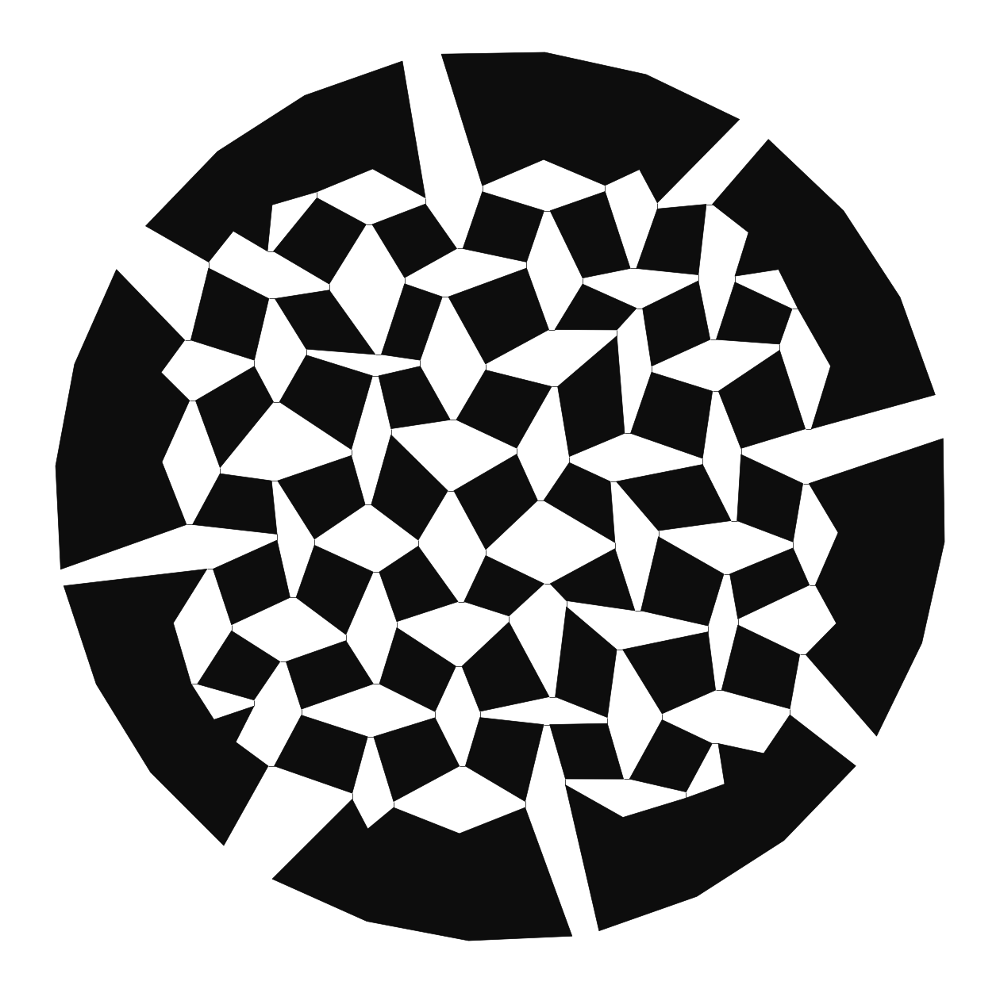

In [15]:

key = random.PRNGKey(2)
key_1, key_2 = random.split(key)
horizontal_shifts_perturbed = horizontal_shifts + 0.1*jax.random.normal(key_1, shape=(n1_blocks+1, n2_blocks, 2)) *spacing
vertical_shifts_perturbed = vertical_shifts + 0.1*jax.random.normal(key_2, shape=(n1_blocks, n2_blocks+1, 2)) *spacing

design_values = (horizontal_shifts_perturbed, vertical_shifts_perturbed)
block_centroids_temp = block_centroids(horizontal_shifts_perturbed, vertical_shifts_perturbed)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts_perturbed, vertical_shifts_perturbed)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(centroid_node_vectors_temp, centroid_node_vectors_temp)], axis=0)
# from blockymetamaterials.plotting import generate_animation
# solution = input_data
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

fig, ax = plt.subplots(figsize=(16,16))
block_idx = jnp.concatenate( (geometry.blocks_inside, jnp.arange(geometry.n_quads, geometry.n_quads+geometry.n_piece)), dtype=int  )
colors = 'k'
plot_geometry(block_centroids_temp,
              centroid_node_vectors_temp,
              _bond_connectivity,
              color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.savefig(f"Figure/122525_circular_structure_design_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_{n_source}_3.eps")
plt.show()

In [9]:
from blockymetamaterials.geometry import Geometry, QuadGeometry, compute_inertia, compute_edge_angles, compute_edge_lengths, DOFsInfo, QuadGeometry_Circle_InputSource, polygon_area, polygon_polar_moment
n1_blocks = 15
n2_blocks = 15
n_piece = 8
n_source = n_piece * 2
spacing = 15. + 0.075*15.  # 1.0  # 15 mm
hinge_length = 0.075*15.  # Same as bond length
initial_angle = 25.0*jnp.pi/180

horizontal_shifts, vertical_shifts = QuadGeometry_Circle_InputSource(n1_blocks, n2_blocks, spacing=spacing, bond_length=hinge_length, n_piece=n_piece).get_design_from_rotated_square(
    angle=initial_angle,
)  # Initial design

# use previous parameters

# Mechanical params
k_stretch = 120.  # stretching stiffness 120. N/mm
k_shear = 1.19  # shearing stiffness 1.19 N/mm
k_rot = 1.50  # rotational stiffness 1.50 Nmm
density = 6.18e-9  # Mg/mm^2


# Dynamic loading (I don't use these parameters)----------
amplitude = 0.5 * spacing  # 0.5 * spacing default 
loading_rate = 30.0 # jnp.array([30., 0., 20., 20., 20.])  #  Hz loading frequency for dynamic input
input_delay = 0.1*30.0**-1 * jnp.ones((n1_blocks,))
#---------------------------------------------------------
min_angle=-15*jnp.pi/180
cutoff_angle=-10*jnp.pi/180

simulation_time = 1.0
n_timepoints = 200
bond_length = hinge_length
linearized_strains = False
use_contact = False
k_contact = k_rot

geometry = QuadGeometry_Circle_InputSource(
    n1_blocks=n1_blocks,
    n2_blocks=n2_blocks,
    spacing=spacing,
    bond_length=bond_length
)

block_centroids, centroid_node_vectors, bond_connectivity, reference_bond_vectors = geometry.get_parametrization()
_bond_connectivity = bond_connectivity()  # Compute bond connectivity once as it is constant
_reference_bond_vectors = reference_bond_vectors(horizontal_shifts, vertical_shifts)  # Compute reference bond vectors once as they are constant


# key = random.PRNGKey(0)
# N = 300


# with open(f"122525_circular_structure_dataset_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_8.pickle", "rb") as f:
#     data_dict = pickle.load(f)
# input_data = data_dict["input_data"]
# output_data = data_dict["output_data"]

# test_N = input_data.shape[0] // 10 # 10 % of total data will be used as test data
# test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=input_data.shape[0])

# mask = jnp.ones(input_data.shape[0], dtype=bool).at[test_idx].set(False)

# training_input_data = input_data[mask]
# training_output_data = output_data[mask]

# test_input_data = input_data[test_idx]
# test_output_data = output_data[test_idx]

# print("input data size : ", input_data.shape)
# print("output data size : ", output_data.shape)

# mm_scaler = minmax_scaler(training_input_data, training_output_data)
# train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
# test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

# model = TimeSeriesCNN(output_features=n_source)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


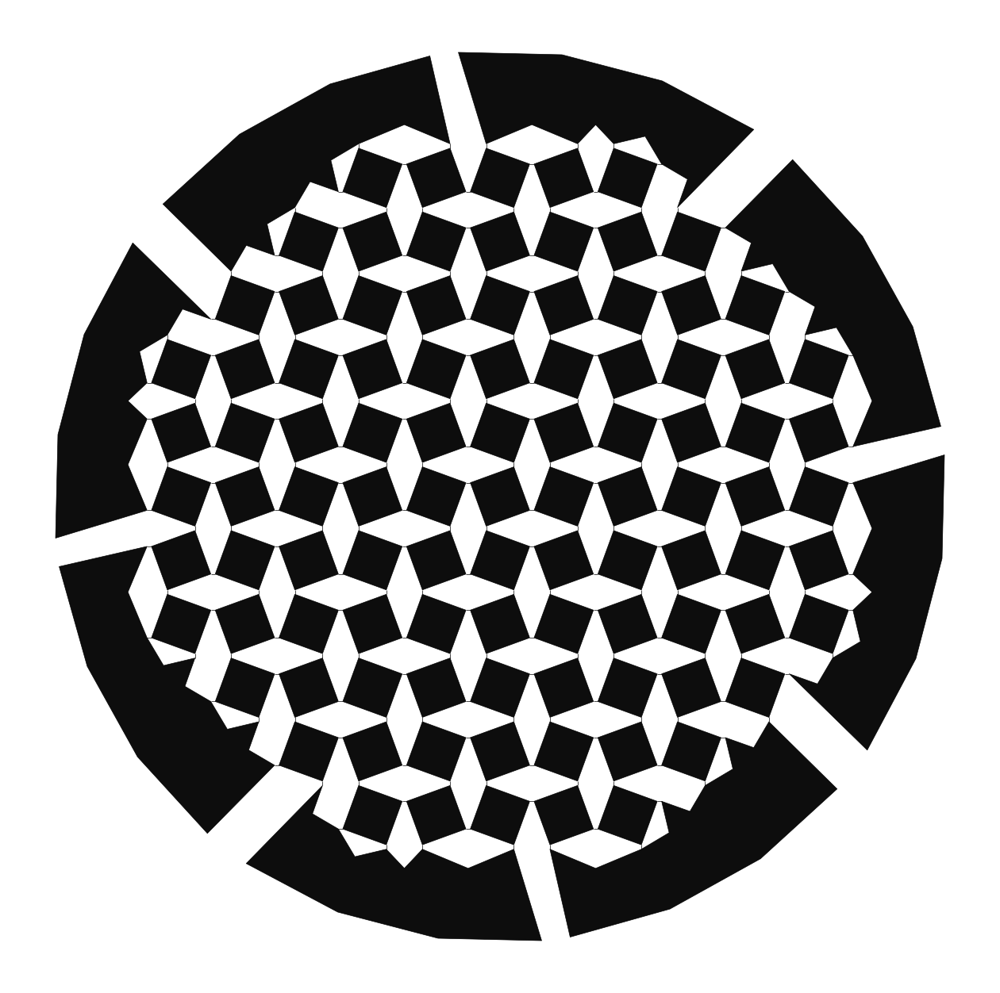

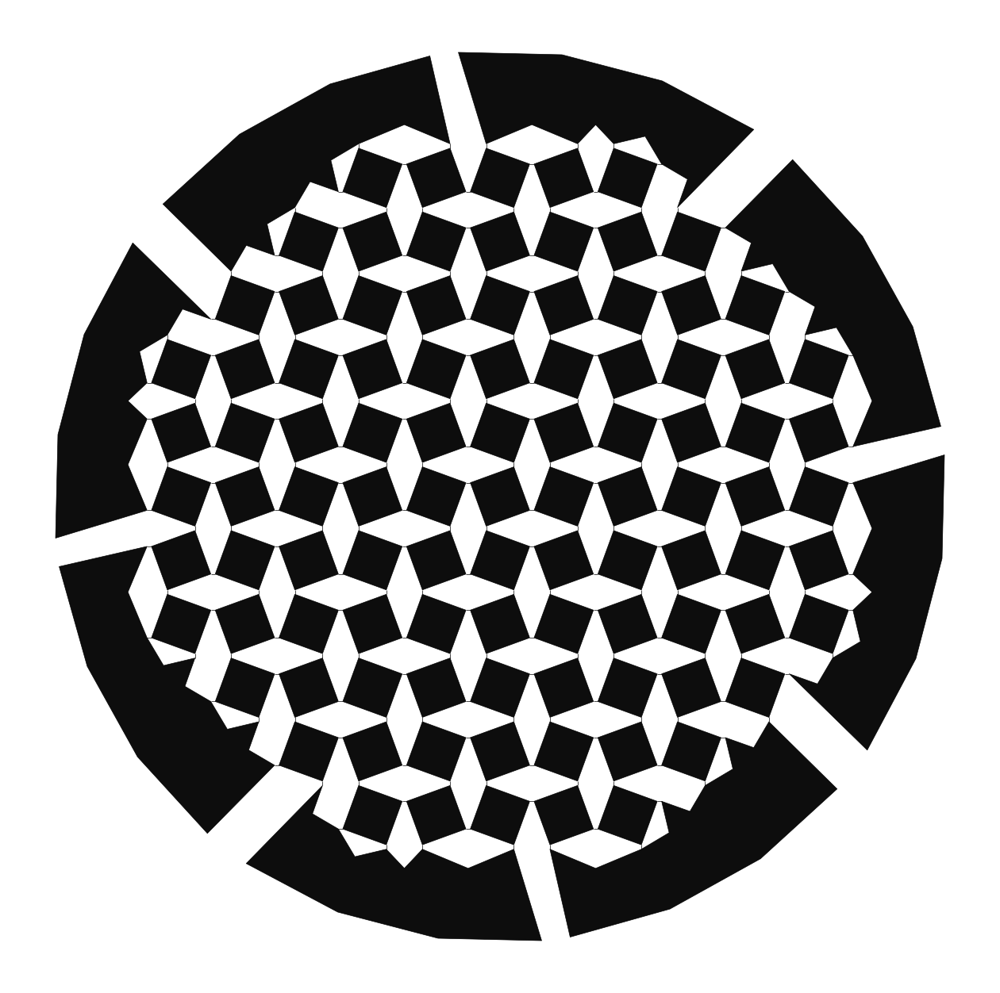

In [10]:
from blockymetamaterials.plotting_input import plot_geometry, compute_xy_limits

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(centroid_node_vectors_temp, centroid_node_vectors_temp)], axis=0)
# from blockymetamaterials.plotting import generate_animation
# solution = input_data
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

fig, ax = plt.subplots(figsize=(16,16))
block_idx = jnp.concatenate( (geometry.blocks_inside, jnp.arange(geometry.n_quads, geometry.n_quads+geometry.n_piece)), dtype=int  )
colors = 'k'
plot_geometry(block_centroids_temp,
              centroid_node_vectors_temp,
              _bond_connectivity,
              color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.savefig(f"Figure/122525_circular_structure_design_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_{n_source}.eps")
plt.show()

In [8]:
ts = jnp.linspace(0,simulation_time,n_timepoints)
label_list = ["Accel x", "Accel y", "Angular vel"]

ylim_accel = jnp.array([-3500, 3500])
R2D = 180. / jnp.pi
ylim_vel = jnp.array([-360,360])

target_idx = 48
for i in range(8):
    plt.figure(figsize=(8,6))
    for j in range(3):
        plt.subplot(3,1,j+1)
        if j < 2:
            plt.plot( ts, input_data[i,:, 2, target_idx, j])
            plt.plot( ts, input_data_opt[i,:, 2, target_idx, j])
            plt.ylim(ylim_accel)
        else:
            plt.plot( ts, input_data[i,:, 1, target_idx, j] * R2D)
            plt.plot( ts, input_data_opt[i,:, 1, target_idx, j] * R2D)
            plt.ylim(ylim_vel)
        plt.ylabel(label_list[j])
    plt.suptitle(f"Data idx {i}")
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.show()

NameError: name 'simulation_time' is not defined

In [ ]:
n_excited_blocks = 8
for count in range(5):
    output_data_temp = training_output_data[count]
    max_value = jnp.max( jnp.abs(output_data_temp) )
    plt.figure(figsize=(8,8))
    for i in range(2*n_excited_blocks):
        plt.subplot(n_excited_blocks,2,i+1)
        if i % 2 == 0:
            plt.plot(ts, output_data_temp[:,i], label=f"block {i//2} x")
        else:
            plt.plot(ts, output_data_temp[:,i], label=f"block {i//2} y")
        plt.ylim(-max_value, 0.0)
        # plt.ylabel("Loading (N)")
        plt.legend()
    plt.suptitle("Loading function (N)")
    plt.tight_layout()
    plt.show()


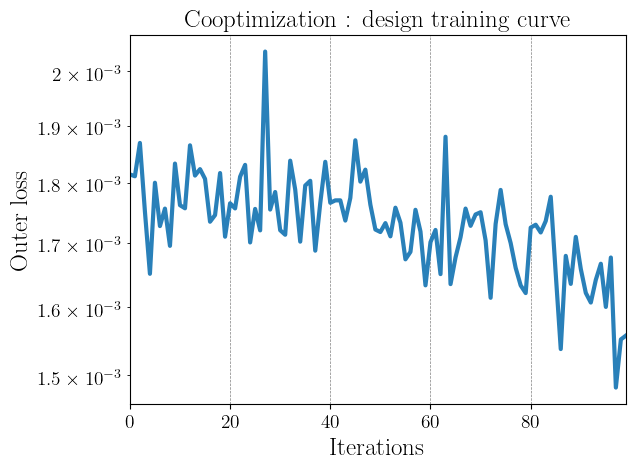

initial loss : 1.8144e-03
minimum loss : 1.4829e-03


In [13]:
with open(f"01052026_circular_structure_cooptimization_n_source_16_measure_idx_48.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

plt.plot(jnp.arange(len(loss_record)), jnp.array(loss_record), '-', lw=3, color=color_list[0])
plt.title('Cooptimization : design training curve')
plt.yscale('log')
plt.ylabel("Outer loss")
plt.xlabel("Iterations")
# plt.legend()
plt.show()
print(f"initial loss : {jnp.array(loss_record)[0]:.4e}")
print(f"minimum loss : {jnp.min(jnp.array(loss_record)):.4e}")


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


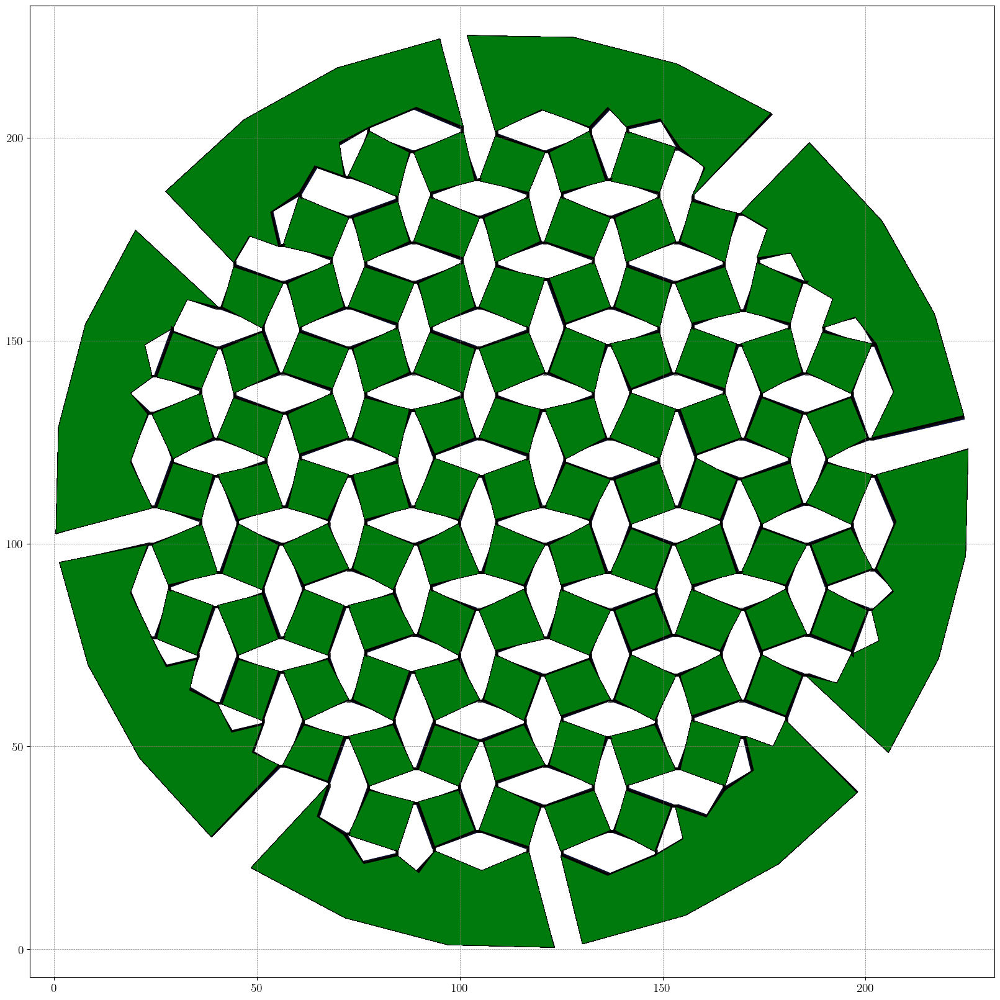

In [24]:
from blockymetamaterials.plotting_input import plot_geometry

hori_shifts_length = (n1_blocks+1) * n2_blocks * 2
geometry_data = []
for i in range(len(param_record)):
    meta_params = param_record[i]
    horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
    vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
    design_values = (horizontal_shifts, vertical_shifts)
    geometry_data.append({
            "block_centroids": geometry.block_centroids(*design_values),
            "centroid_node_vectors": geometry.centroid_node_vectors(*design_values),
            "bond_connectivity": geometry.bond_connectivity(),
            "deformed": False
        })
    
    # fig, ax = plt.subplots(figsize=(16,16))
    
    # colors = 'k'
    # plot_geometry(geometry_data[i]["block_centroids"],
    #             geometry_data[i]["centroid_node_vectors"],
    #             geometry_data[i]["bond_connectivity"],
    #             color=colors, ax=ax)
    # ax.axis("equal")
    # ax.axis("off")
    # plt.show()

from blockymetamaterials.plotting_input import plot_multiple_geometries, compute_xy_limits

block_centroids_temp = geometry.block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = geometry.centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])
colors = ['b','g','r','c','m','y','k']
plot_multiple_geometries(
    geometry_data,
    colors=colors,
    figsize=(16,16),
    xlim=xlim, ylim=ylim
)
plt.show()

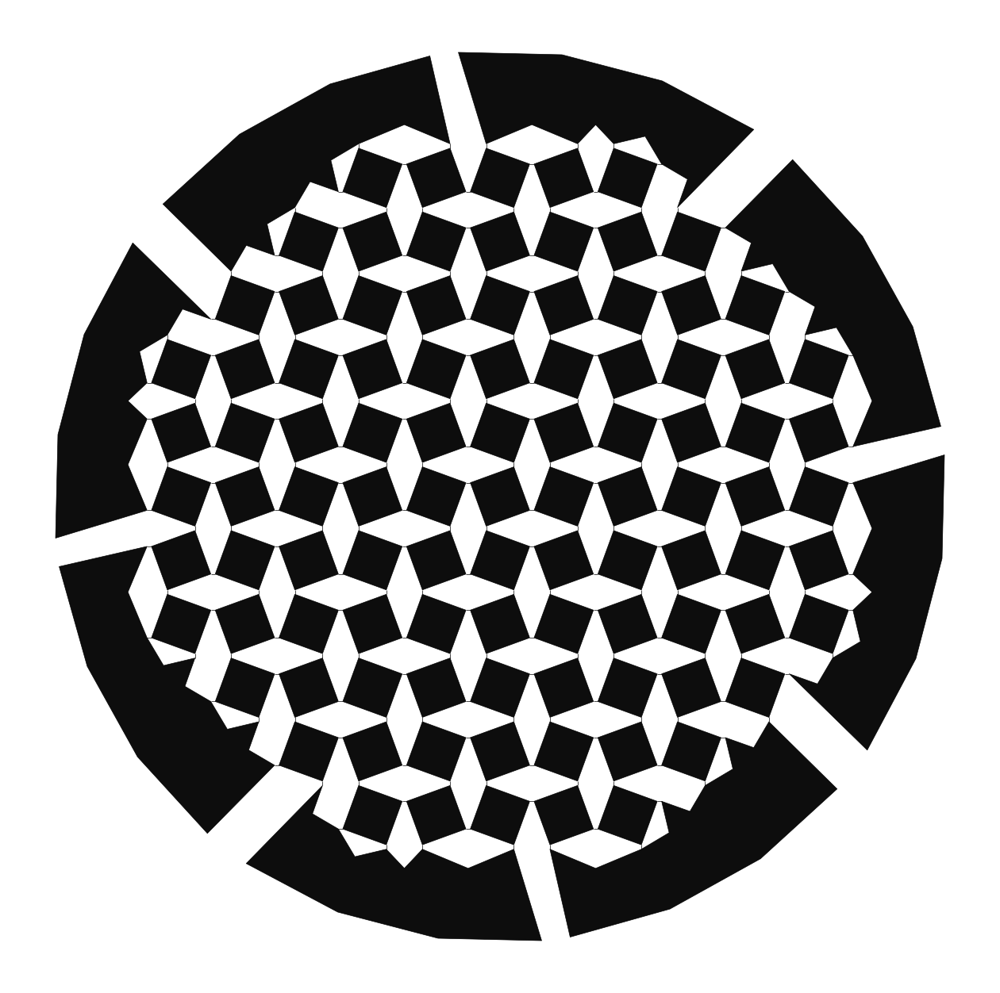

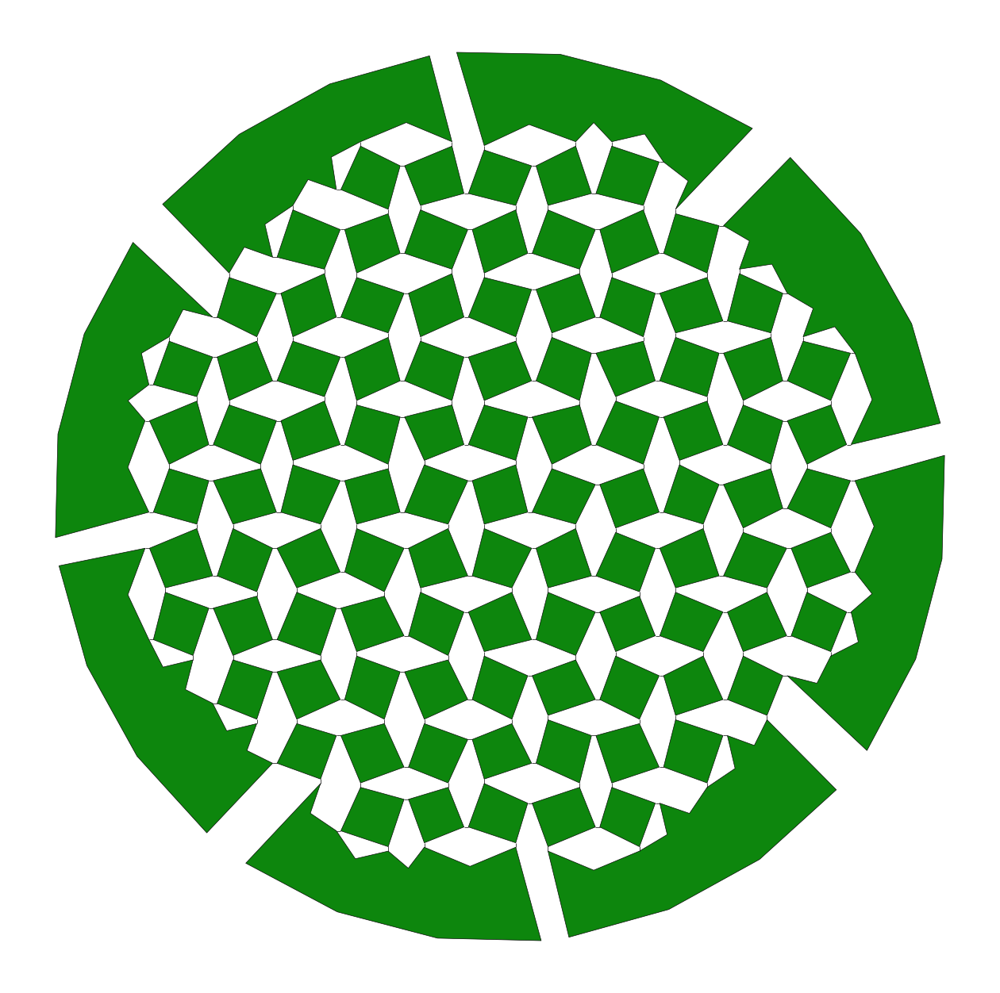

In [26]:
fig, ax = plt.subplots(figsize=(16,16))
colors = 'k'
i=0
plot_geometry(geometry_data[i]["block_centroids"],
            geometry_data[i]["centroid_node_vectors"],
            geometry_data[i]["bond_connectivity"],
            color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.show()

opt_idx = jnp.argmin(jnp.array(loss_record))
fig, ax = plt.subplots(figsize=(16,16))
colors = 'g'
plot_geometry(geometry_data[opt_idx]["block_centroids"],
            geometry_data[opt_idx]["centroid_node_vectors"],
            geometry_data[opt_idx]["bond_connectivity"],
            color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.show()

Data loaded from file.
(1, 1, 3) (1, 1, 3)
(1, 1, 16) (1, 1, 16)
prediction shape :  (300, 200, 16)
Step : 0  Loss : 0.3837152661437927 Test Loss : 0.3827047998505902
Step : 10  Loss : 0.03158837367159061 Test Loss : 0.03128003288822017
Step : 20  Loss : 0.012106597139109625 Test Loss : 0.012204426248940187
Step : 30  Loss : 0.006848783321932347 Test Loss : 0.006901137473184561
Step : 40  Loss : 0.005301877486135787 Test Loss : 0.005416106894491417
Step : 50  Loss : 0.004485895045048699 Test Loss : 0.004489715328502354
Step : 60  Loss : 0.004073762684482711 Test Loss : 0.004078173204850324
Step : 70  Loss : 0.003822822670898973 Test Loss : 0.003827254826574983
Step : 80  Loss : 0.003664299902617386 Test Loss : 0.0036849092560764162
Step : 90  Loss : 0.0035427640784777012 Test Loss : 0.00356480025178247
Step : 100  Loss : 0.0034417511428224737 Test Loss : 0.003465370327326083
Step : 110  Loss : 0.0033535366185293933 Test Loss : 0.0033696988596368022
Step : 120  Loss : 0.0032725099078610

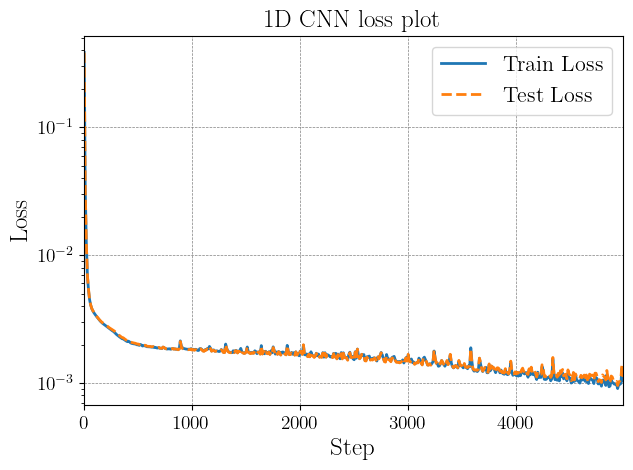

best loss :  0.0009056173267798042


In [35]:
filename = f"122525_circular_structure_dataset_n1_blocks_15_n2_blocks_15_n_source_8.pickle"
with open(filename, "rb") as f:
    data_dict = pickle.load(f)
    input_data = data_dict["input_data"]
    output_data = data_dict["output_data"]
print("Data loaded from file.")

key = random.PRNGKey(0)
test_N = input_data.shape[0] // 10 # 10 % of total data will be used as test data
test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=input_data.shape[0])
mask = jnp.ones(input_data.shape[0], dtype=bool).at[test_idx].set(False)

training_input_data = input_data[mask]
training_output_data = output_data[mask]
test_input_data = input_data[test_idx]
test_output_data = output_data[test_idx]

mm_scaler = minmax_scaler(training_input_data, training_output_data)
train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

model = TimeSeriesCNN(output_features=n_source) # simple CNN
init_params = model.init(key, input_data)
preds = model.apply(init_params, input_data)
print("prediction shape : ", preds.shape)

def inner_loss(params, data):
  # print("inner loss")
  inputs, targets = data
  predictions = model.apply(params, inputs)
  mse = jnp.mean((predictions - targets)**2)  # this is L(phi_prime, D^{tr}_i)
  return mse


innerlr = 1e-2
inneriter = 5000

maxiter = 20
tol = 1e-7
inner_solver = OptaxSolver(opt=optax.adam(innerlr),
                            fun=inner_loss,
                            maxiter=inneriter,
                            tol=1e-12,
                            implicit_diff=True,
                            implicit_diff_solve=Partial(
                            linear_solve.solve_cg,
                            maxiter=maxiter, # 5
                            tol=tol),
                            )

params = init_params
opt_state = inner_solver.init_state(init_params, (train_data_normalized, train_output_normalized))

train_loss_record = []
test_loss_record = []
min_loss = 100000.
for i in range(5000):
    params, opt_state = inner_solver.update(params, opt_state, (train_data_normalized, train_output_normalized))

    if i % 10 == 0:
        # predictions = model.apply(params, train_data_normalized)
        predictions = model.apply(params, train_data_normalized)
        predictions_test = model.apply(params, test_data_normalized)
        # predictions_test = model.apply(params, test_input_batch)
        train_loss = jnp.mean((predictions - train_output_normalized)**2)
        test_loss = jnp.mean((predictions_test - test_output_normalized)**2)

        train_loss_record.append(train_loss)
        test_loss_record.append(test_loss)

        if min_loss > train_loss:
            best_params = params
            min_loss = train_loss

        print(f"Step : {i}  Loss : {train_loss} Test Loss : {test_loss}")
        # print(f"Step : {i}  Loss : {train_loss}")

# Optional: plot the loss curve
plt.plot( jnp.arange(0, len(train_loss_record)*10, 10), jnp.array(train_loss_record), label='Train Loss' )
plt.plot( jnp.arange(0, len(test_loss_record)*10, 10), jnp.array(test_loss_record), '--', label='Test Loss' )
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("1D CNN loss plot")
plt.grid(True)
plt.tight_layout()
plt.yscale("log")
plt.legend()
plt.show()

print("best loss : ", min_loss)

training loss : 9.0562e-04
test loss : 9.5699e-04
TRAIN


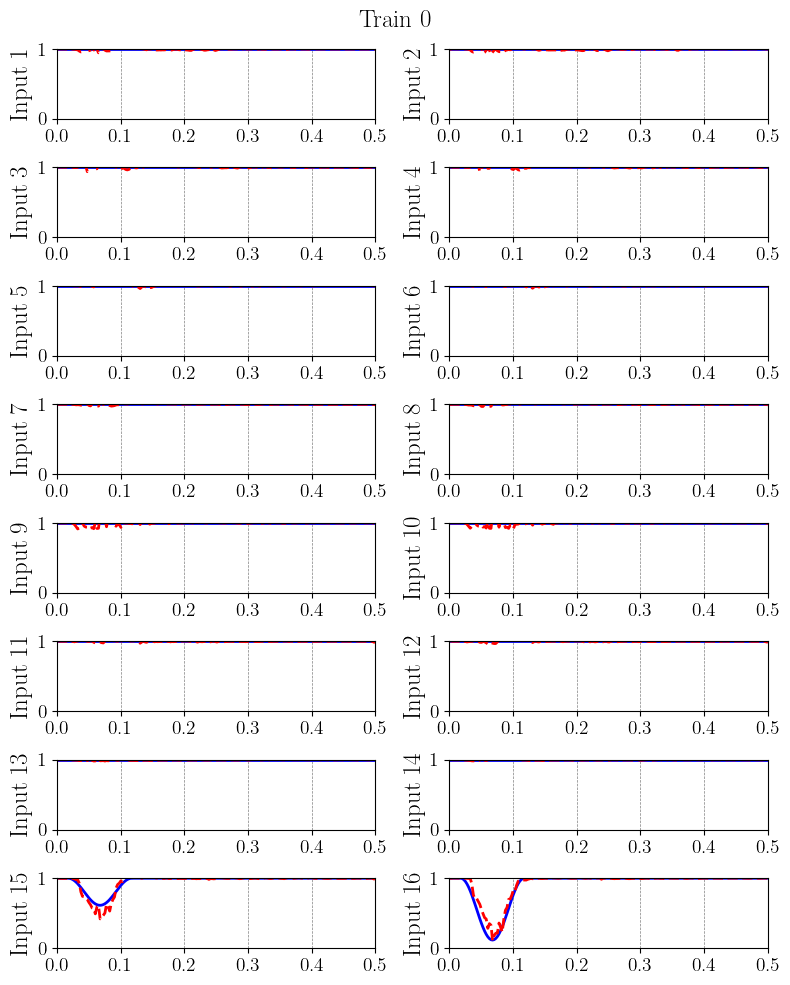

TEST


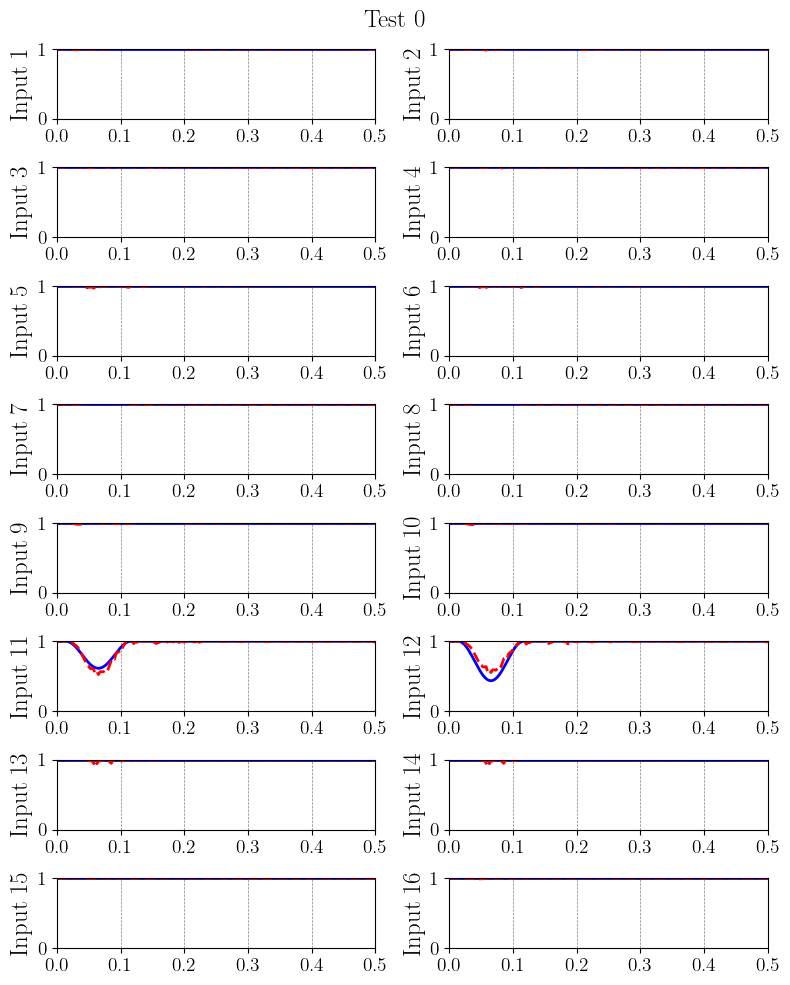

In [43]:
model = TimeSeriesCNN(output_features=n_source)
pred_y = model.apply(best_params, train_data_normalized)
mse = jnp.mean((pred_y - train_output_normalized)**2)  

pred_y_test = model.apply(best_params, test_data_normalized)
mse_test = jnp.mean((pred_y_test - test_output_normalized)**2)
print(f"training loss : {mse:.4e}")
print(f"test loss : {mse_test:.4e}")

print("TRAIN")
for i in range(1):
    plt.figure(figsize=(8,10))
    for j in range(n_source):
        plt.subplot(n_source//2,2,1+j)
        plt.plot( ts, train_output_normalized[i,:,j], "b-", label="True")
        plt.plot( ts, pred_y[i,:,j], "r--", label="Prediction from CNN")
        plt.ylim(0.,1.)
        plt.ylabel(f"Input {j+1}")
    # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
    # plt.legend()
    plt.tight_layout()
    plt.suptitle(f"Train {i}")
    plt.tight_layout()
    # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
    plt.show()

print("TEST")
for i in range(1):
    plt.figure(figsize=(8,10))
    for j in range(n_source):
        plt.subplot(n_source//2,2,1+j)
        plt.plot( ts, test_output_normalized[i,:,j], "b-", label="True")
        plt.plot( ts, pred_y_test[i,:,j], "r--", label="Prediction from CNN")
        plt.ylim(0.,1.)
        plt.ylabel(f"Input {j+1}")
    # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
    # plt.legend()
    plt.tight_layout()
    plt.suptitle(f"Test {i}")
    plt.tight_layout()
    # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
    plt.show()

In [42]:
input_data.shape

(0, 200, 3, 105, 3)

In [45]:
key = random.PRNGKey(0)
test_N = 30 # 10 % of total data will be used as test data
test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=300)
mask = jnp.ones(300, dtype=bool).at[test_idx].set(False)

with open(f"012326_circular_structure_dataset_n_source_8_exp_param_free_set_4.pickle", "rb") as f:
    results_dict = pickle.load(f)
    input_data = results_dict["input_data"][test_idx]
    output_data = results_dict["output_data"][test_idx]

with open(f"01302026_simulation_results_n_source_16_measure_idx_48_exp_param_set_4_lr_0.1.pickle", "rb") as f:
    results_dict_opt = pickle.load(f)
    input_data_opt = results_dict_opt["input_data"][test_idx]
    output_data_opt = results_dict_opt["output_data"][test_idx]

simulation_time = 1.0
n_timepoints = 200
ts = jnp.linspace(0, simulation_time, n_timepoints)

horizontal_shifts, vertical_shifts = QuadGeometry_Circle_InputSource(n1_blocks, n2_blocks, spacing=spacing, bond_length=hinge_length, n_piece=n_piece).get_design_from_rotated_square(
    angle=initial_angle,
)  # Initial design

horizontal_shifts_opt = results_dict_opt["horizontal_shifts"]
vertical_shifts_opt = results_dict_opt["vertical_shifts"]

x_max = jnp.max( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,0], results_dict["input_data"][:,:,0,:,0]], axis=0 ) )
x_min = jnp.min( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,0], results_dict["input_data"][:,:,0,:,0]], axis=0 ) )
y_max = jnp.max( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,1], results_dict["input_data"][:,:,0,:,1]], axis=0 ) )
y_min = jnp.min( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,1], results_dict["input_data"][:,:,0,:,1]], axis=0 ) )


from blockymetamaterials.plotting_input import generate_animation, compute_xy_limits

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)
shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim_structure, ylim_structure = compute_xy_limits(shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])


block_centroids_opt_temp = block_centroids(horizontal_shifts_opt, vertical_shifts_opt)
centroid_node_vectors_opt_temp = centroid_node_vectors(horizontal_shifts_opt, vertical_shifts_opt)


x_lim = jnp.array([xlim_structure[0] + x_min, xlim_structure[1] + x_max])
y_lim = jnp.array([ylim_structure[0] + y_min, ylim_structure[1] + y_max])

# vel =  jnp.concatenate( [results_dict_opt["input_data"][:,:,1,:,0], results_dict["input_data"][:,:,1,:,0]], axis=0 )
vel =  jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,2], results_dict["input_data"][:,:,0,:,2]], axis=0 )
vel_mag = vel # jnp.linalg.norm(vel, axis=-1)
v_max = jnp.max( vel_mag )
v_min = jnp.min( vel_mag )
v_lim = jnp.array([v_min, v_max])

print( v_lim * R2D )

for i in range(1,8):
    solutionData = SolutionData(
        block_centroids=block_centroids_temp,#block_centroids(horizontal_shifts, vertical_shifts),
        centroid_node_vectors=centroid_node_vectors_temp,#centroid_node_vectors(horizontal_shifts, vertical_shifts),
        bond_connectivity=_bond_connectivity,
        timepoints=ts,
        fields=input_data[i]
    )

    out_filename = f"Simulation/Circular_Structure/012326_circular_structure_dataset_n_source_8_exp_param_free_set_4_test_data_idx_{i}_angle"
    start = time.time()
    generate_animation(
        data=solutionData,
        field="theta",
        out_filename=out_filename,
        deformed=True,
        xlim=x_lim,
        ylim=y_lim,
        figsize=(8, 7.35*(geometry.n2_blocks)/geometry.n1_blocks),
        fontsize=14,
        fps=30,
        dpi=300,
        legend_label=None,#"Velocity [mm/s]",
        cmap="inferno",
        vlim=v_lim,
        axis=False
    )
    print("animation making time : ", time.time()-start)

    solutionData = SolutionData(
        block_centroids=block_centroids_opt_temp,
        centroid_node_vectors=centroid_node_vectors_opt_temp,
        bond_connectivity=_bond_connectivity,
        timepoints=ts,
        fields=input_data_opt[i]
    )

    out_filename = f"Simulation/Circular_Structure/012326_circular_structure_dataset_n_source_8_exp_param_free_set_4_test_data_idx_{i}_opt_angle"
    start = time.time()
    generate_animation(
        data=solutionData,
        field="theta",
        out_filename=out_filename,
        deformed=True,
        xlim=x_lim,
        ylim=y_lim,
        figsize=(8, 7.35*(geometry.n2_blocks)/geometry.n1_blocks),
        fontsize=14,
        fps=30,
        dpi=300,
        legend_label=None, #"Velocity [mm/s]",
        cmap="inferno",
        vlim=v_lim,
        axis=False
    )
    print("animation making time : ", time.time()-start)

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


[-21.38019767  19.8687067 ]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.08279538154602


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  44.93509864807129


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.07404017448425


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  44.841880798339844


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.06417965888977


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.346559047698975


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.27855181694031


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.57137703895569


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.891926765441895


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.04148554801941


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.41139507293701


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.25036597251892


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.24772095680237


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.02323055267334


In [37]:
vel =  jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,2], results_dict["input_data"][:,:,0,:,2]], axis=0 )
vel_mag = vel
v_max = jnp.max( vel_mag )
v_min = jnp.min( vel_mag )
v_lim = jnp.array([v_min, v_max])

print( v_lim * R2D )

[-21.38019767  19.8687067 ]


## Compare results

In [45]:
class minmax_scaler():
  def __init__(self, input_data, output_data):
    # assume that 
    self.data_max = jnp.max(input_data, axis=(0, 1), keepdims=True)
    self.data_min = jnp.min(input_data, axis=(0, 1), keepdims=True)
    print(self.data_max.shape, self.data_min.shape)

    self.output_data_max = jnp.max(output_data, axis=(0, 1), keepdims=True)
    self.output_data_min = jnp.min(output_data, axis=(0, 1), keepdims=True)
    print(self.output_data_max.shape, self.output_data_min.shape)

  def transform(self, input_data, output_data):
    data_normalized = 2.0 * ( input_data - self.data_min ) / ( self.data_max - self.data_min ) - 1.0  # Add a small value to avoid division by zero
    output_normalized = (output_data - self.output_data_min) / (self.output_data_max - self.output_data_min)
    return data_normalized, output_normalized
  
  def inverse_transform(self, data_normalized, output_normalized):
    data_original = (data_normalized + 1.0) * (self.data_max - self.data_min) / 2.0 + self.data_min
    output_original = output_normalized * (self.output_data_max - self.output_data_min) + self.output_data_min
    return data_original, output_original

  def information(self):
    print("data min : ", self.data_min)
    print("data max : ", self.data_max)
    print("test data min : ", self.output_data_min)
    print("test data max : ", self.output_data_max)
    return self.data_min, self.data_max, self.output_data_min, self.output_data_max
    
class TimeSeriesCNN(nn.Module):
    features: int = 64
    output_features: int = 2

    @nn.compact
    def __call__(self, x):
        # Input shape: (batch_size, time_steps, 2)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.output_features, kernel_size=(1,), padding='SAME')(x)  # Final output: 2 channels
        return x  # Shape: (batch_size, time_steps, 2)

filename = f"122525_circular_structure_dataset_n1_blocks_15_n2_blocks_15_n_source_8.pickle"
with open(filename, "rb") as f:
    data_dict = pickle.load(f)
    input_data = data_dict["input_data"]
    output_data = data_dict["output_data"]
print("Data loaded from file.")

key = random.PRNGKey(0)
test_N = input_data.shape[0] // 10 # 10 % of total data will be used as test data
test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=input_data.shape[0])
mask = jnp.ones(input_data.shape[0], dtype=bool).at[test_idx].set(False)

training_input_data = input_data[mask]
training_output_data = output_data[mask]
test_input_data = input_data[test_idx]
test_output_data = output_data[test_idx]

mm_scaler = minmax_scaler(training_input_data, training_output_data)
train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

print(train_data_normalized.min(), train_data_normalized.max())
print(test_data_normalized.min(), test_data_normalized.max())


Data loaded from file.
(1, 1, 3) (1, 1, 3)
(1, 1, 16) (1, 1, 16)
-1.0 1.0
-0.7616171384993631 0.9170484528273612


In [ ]:
with open(f"01052026_circular_structure_cooptimization_n_source_16_measure_idx_48.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

training init loss : 1.8299e-03
test init loss : 1.8144e-03
training optimized loss : 1.4971e-03
test optimized loss : 1.4829e-03
TRAIN


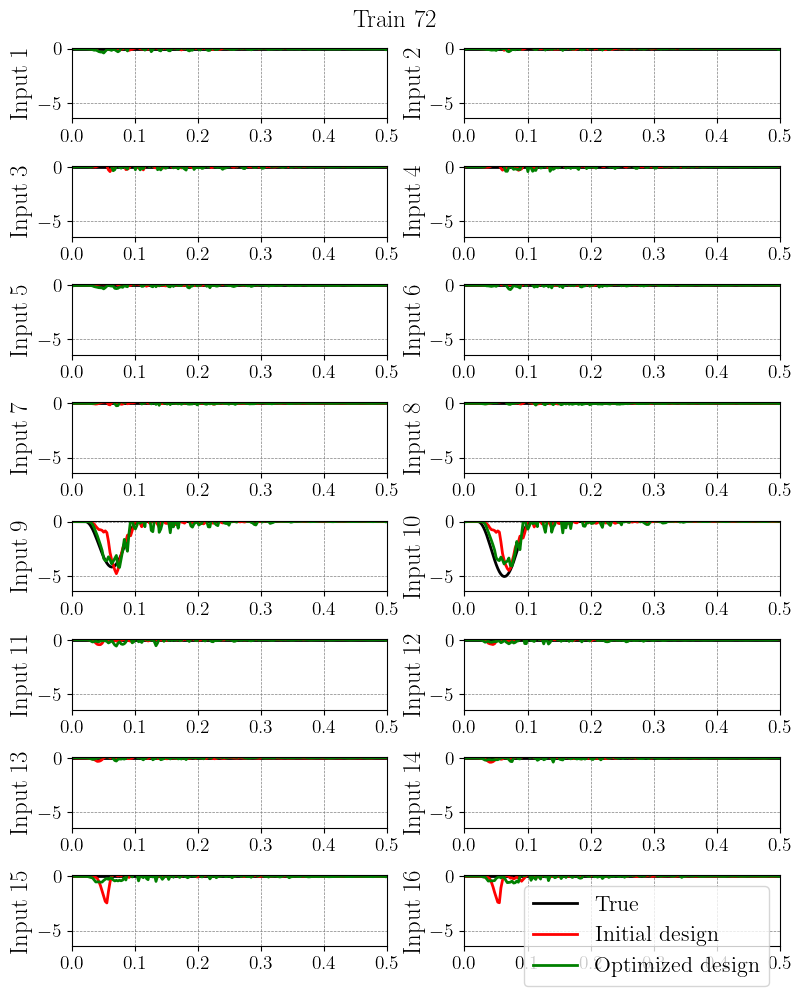

TEST


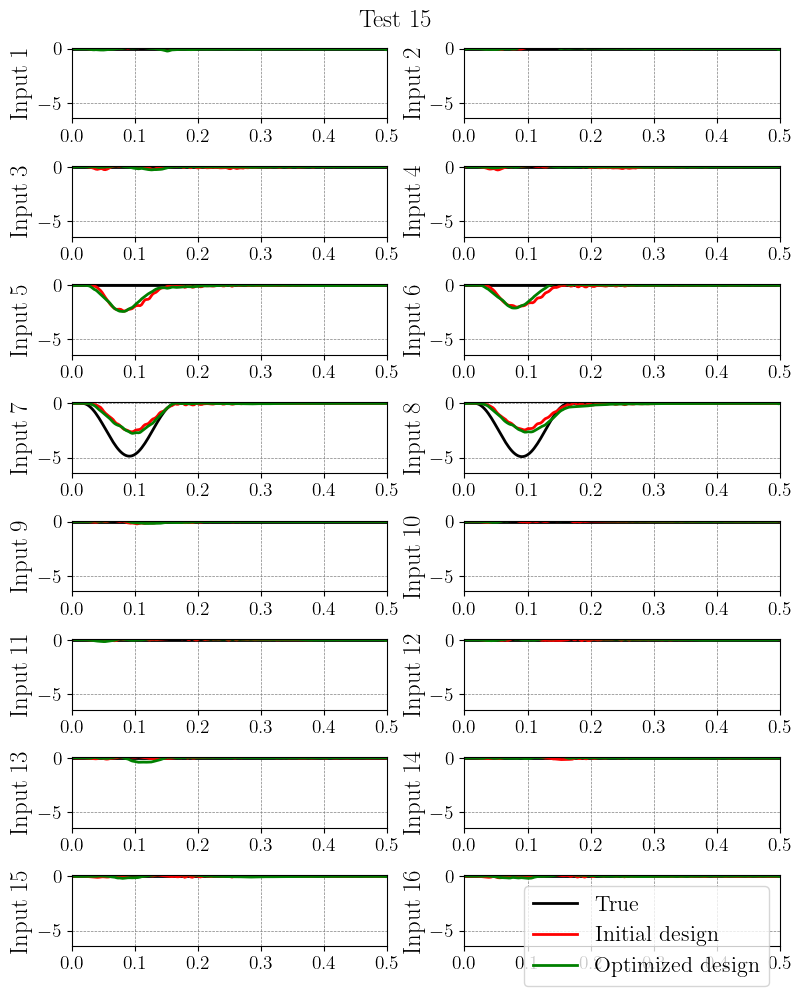

In [54]:
with open(f"01052026_circular_structure_cooptimization_n_source_16_measure_idx_48.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

model = TimeSeriesCNN(output_features=n_source)

random_idx = jax.random.randint(key, shape=(1,), minval=0, maxval=training_input_data.shape[0]).sort()
random_idx_test = jax.random.randint(key, shape=(1,), minval=0, maxval=test_input_data.shape[0]).sort()

# initial performance
hori_shifts_length = (n1_blocks+1) * n2_blocks * 2
in_param_sol = in_param_record[0][0]
training_input_data = in_param_record[0][2]
training_output_data = in_param_record[0][3]
test_input_data = in_param_record[0][4]
test_output_data = in_param_record[0][5]

train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

pred_y = model.apply(in_param_sol, train_data_normalized)
mse = jnp.mean((pred_y - train_output_normalized)**2)  
pred_y_test = model.apply(in_param_sol, test_data_normalized)
mse_test = jnp.mean((pred_y_test - test_output_normalized)**2)
print(f"training init loss : {mse:.4e}")
print(f"test init loss : {mse_test:.4e}")


opt_idx = jnp.argmin(jnp.array(loss_record))

in_param_sol = in_param_record[opt_idx][0]
training_input_data = in_param_record[opt_idx][2]
training_output_data = in_param_record[opt_idx][3]
test_input_data = in_param_record[opt_idx][4]
test_output_data = in_param_record[opt_idx][5]

train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

pred_y_opt = model.apply(in_param_sol, train_data_normalized)
mse_opt = jnp.mean((pred_y_opt - train_output_normalized)**2)  
pred_y_test_opt = model.apply(in_param_sol, test_data_normalized)
mse_test_opt = jnp.mean((pred_y_test_opt - test_output_normalized)**2)
print(f"training optimized loss : {mse_opt:.4e}")
print(f"test optimized loss : {mse_test_opt:.4e}")


# for i in random_idx:
#     plt.figure(figsize=(10,1.5*n_source))
#     for j in range(n_source):
#         plt.subplot(n_source//2,2,1+j)
#         plt.plot( ts, train_output_normalized[i,:,j], "k-", label="True")
#         plt.plot( ts, pred_y[i,:,j], "r-", label="Initial design")
#         plt.plot( ts, pred_y_opt[i,:,j], "g-", label="Optimized design")
#         # plt.ylim(min_value, 1e-1)
#         plt.ylabel(f"Input {j+1}")
#     # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
#     plt.legend()
#     plt.suptitle(f"Train {i}")
#     plt.tight_layout()
#     # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
#     plt.show()



# original scale
_, pred_y_org = mm_scaler.inverse_transform(train_data_normalized, pred_y)
_, pred_y_opt_org = mm_scaler.inverse_transform(train_data_normalized, pred_y_opt)

ts = jnp.linspace(0, simulation_time, n_timepoints)

min_value = jnp.min(mm_scaler.output_data_min)
print("TRAIN")
for i in random_idx:
    plt.figure(figsize=(8,10))#plt.figure(figsize=(10,1.5*n_source))
    for j in range(n_source):
        plt.subplot(n_source//2,2,1+j)
        plt.plot( ts, training_output_data[i,:,j], "k-", label="True")
        plt.plot( ts, pred_y_org[i,:,j], "r-", label="Initial design")
        plt.plot( ts, pred_y_opt_org[i,:,j], "g-", label="Optimized design")
        plt.ylim(min_value, 1e-1)
        plt.ylabel(f"Input {j+1}")
    # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
    plt.legend()
    plt.suptitle(f"Train {i}")
    plt.tight_layout()
    # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
    plt.show()


_, pred_y_test_org = mm_scaler.inverse_transform(train_data_normalized, pred_y_test)
_, pred_y_test_opt_org = mm_scaler.inverse_transform(train_data_normalized, pred_y_test_opt)

print("TEST")
for i in random_idx_test:
    plt.figure(figsize=(8,10))
    for j in range(n_source):
        plt.subplot(n_source//2,2,1+j)
        plt.plot( ts, test_output_data[i,:,j], "k-", label="True")
        plt.plot( ts, pred_y_test_org[i,:,j], "r-", label="Initial design")
        plt.plot( ts, pred_y_test_opt_org[i,:,j], "g-", label="Optimized design")
        plt.ylim(min_value, 1e-1)
        plt.ylabel(f"Input {j+1}")
    # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
    plt.legend()
    plt.suptitle(f"Test {i}")
    plt.tight_layout()
    # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
    plt.show()

# print("TEST")
# for i in random_idx_test:
#     plt.figure(figsize=(10,1.5*n_source))
#     for j in range(n_source):
#         plt.subplot(n_source//2,2,1+j)
#         plt.plot( ts, test_output_normalized[i,:,j], "k-", label="True")
#         plt.plot( ts, pred_y_test[i,:,j], "r-", label="Initial design")
#         plt.plot( ts, pred_y_test_opt[i,:,j], "g-", label="Optimized design")
#         # plt.ylim(min_value, 1e-1)
#         plt.ylabel(f"Input {j+1}")
#     # plt.legend(loc='lower left', bbox_to_anchor=(1.0,0.5))
#     plt.legend()
#     plt.tight_layout()
#     plt.suptitle(f"Test {i}")
#     plt.tight_layout()
#     # plt.savefig(f'CNN_GD_ID/Test_{i}.png', bbox_inches='tight')
#     plt.show()

In [53]:
train_data_normalized.min(), train_data_normalized.max()

(Array(-1.20446252, dtype=float64), Array(1.03847146, dtype=float64))

In [51]:
in_param_sol = in_param_record[opt_idx][0]
training_input_data = in_param_record[opt_idx][2]
training_output_data = in_param_record[opt_idx][3]
test_input_data = in_param_record[opt_idx][4]
test_output_data = in_param_record[opt_idx][5]

train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

pred_y_opt = model.apply(in_param_sol, train_data_normalized)
mse_opt = jnp.mean((pred_y_opt - train_output_normalized)**2)  
pred_y_test_opt = model.apply(in_param_sol, test_data_normalized)
mse_test_opt = jnp.mean((pred_y_test_opt - test_output_normalized)**2)
print(f"training optimized loss : {mse_opt:.4e}")
print(f"test optimized loss : {mse_test_opt:.4e}")

training optimized loss : 1.8137e-03
test optimized loss : 1.8067e-03


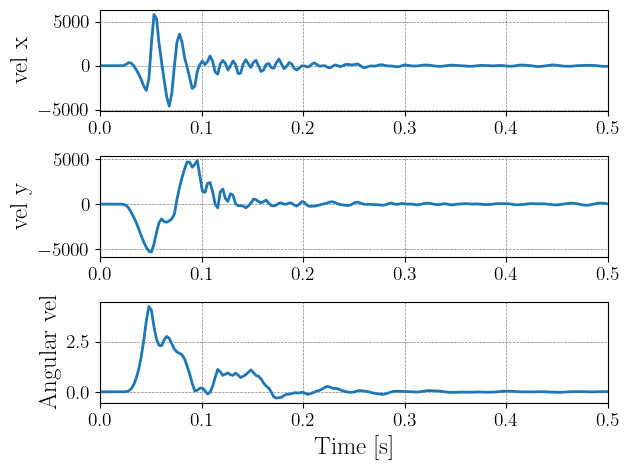

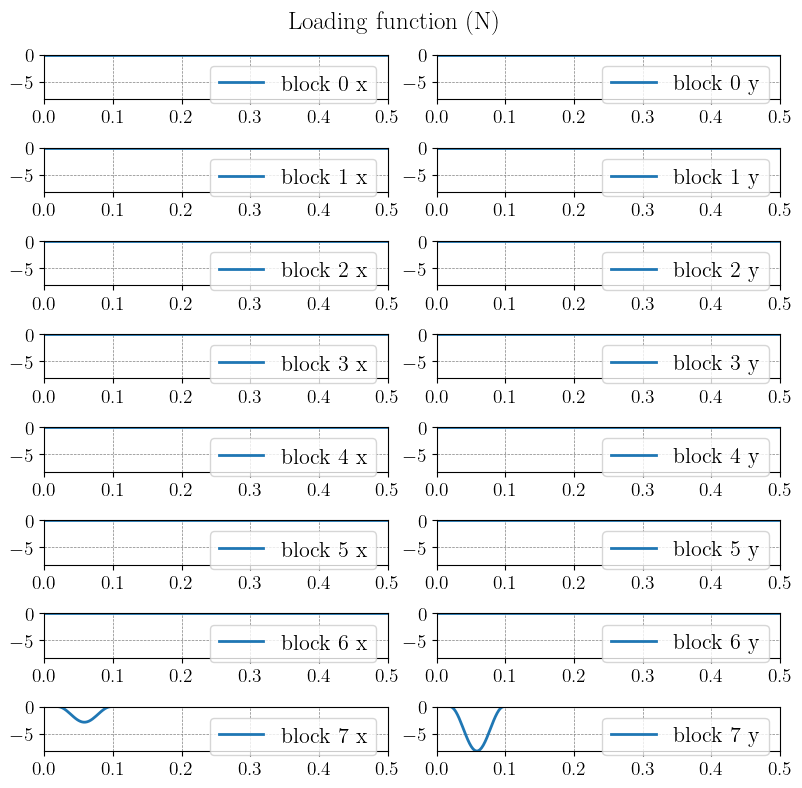

In [34]:
ts = jnp.linspace(0,simulation_time,n_timepoints)
label_list = ["vel x", "vel y", "Angular vel"]
for i in range(1):
    for j in range(3):
        plt.subplot(3,1,j+1)
        plt.plot( ts, training_input_data[i,:,j])
        plt.ylabel(label_list[j])
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.show()


n_excited_blocks = 8
for count in range(1):
    output_data_temp = training_output_data[count]
    max_value = jnp.max( jnp.abs(output_data_temp) )
    plt.figure(figsize=(8,8))
    for i in range(2*n_excited_blocks):
        plt.subplot(n_excited_blocks,2,i+1)
        if i % 2 == 0:
            plt.plot(ts, output_data_temp[:,i], label=f"block {i//2} x")
        else:
            plt.plot(ts, output_data_temp[:,i], label=f"block {i//2} y")
        plt.ylim(-max_value, 0.0)
        # plt.ylabel("Loading (N)")
        plt.legend()
    plt.suptitle("Loading function (N)")
    plt.tight_layout()
    plt.show()

initial loss : 3.7288e-03
minimum loss : 2.5812e-03


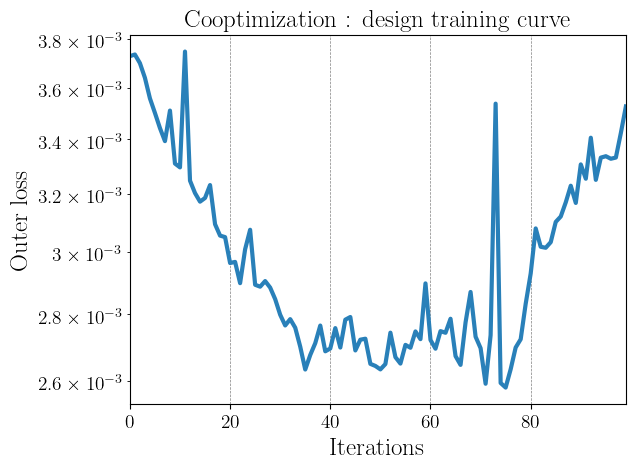

In [17]:
with open(f"01292026_circular_structure_cooptimization_n_source_16_measure_idx_47_exp_param_fix_center_lr_0.2.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

print(f"initial loss : {jnp.array(loss_record)[0]:.4e}")
print(f"minimum loss : {jnp.min(jnp.array(loss_record)):.4e}")

plt.plot(jnp.arange(len(loss_record)), jnp.array(loss_record), '-', lw=3, color=color_list[0])
plt.title('Cooptimization : design training curve')
plt.yscale('log')
plt.ylabel("Outer loss")
plt.xlabel("Iterations")
# plt.legend()
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


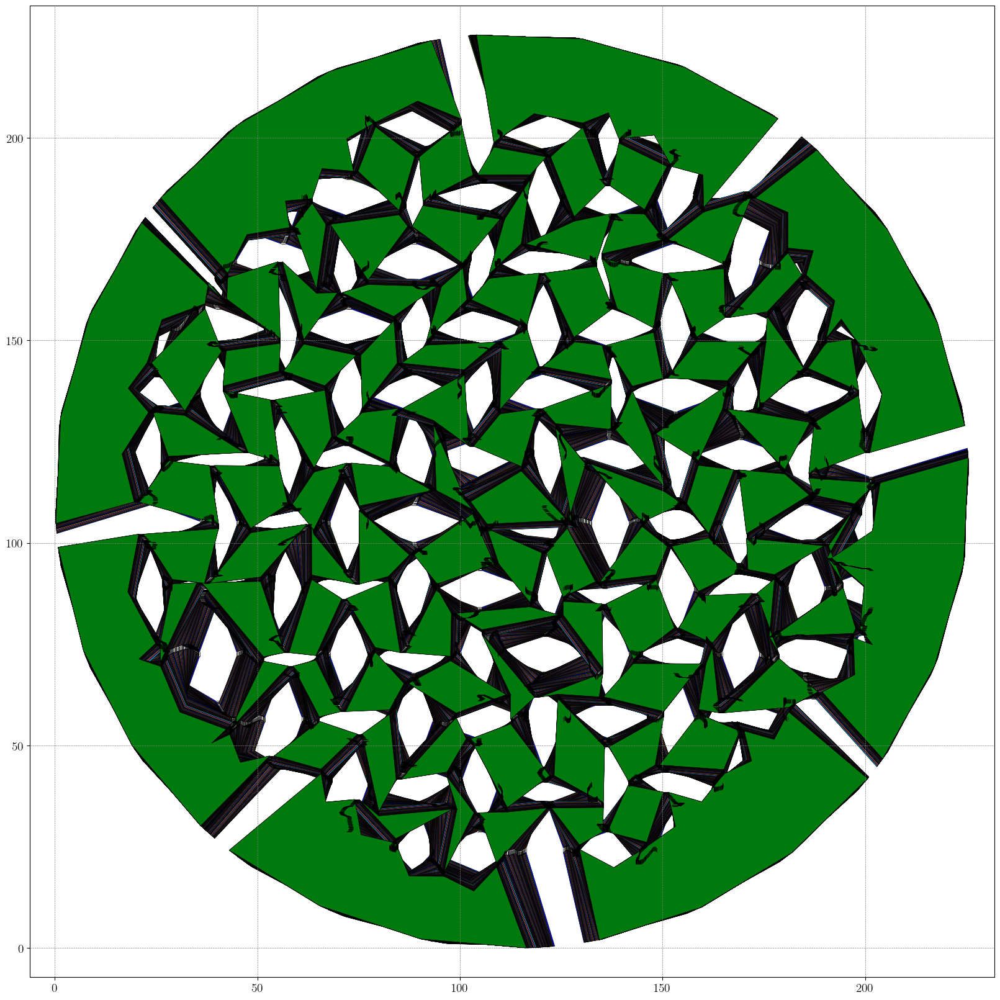

In [ ]:
from blockymetamaterials.plotting_input import plot_geometry

hori_shifts_length = (n1_blocks+1) * n2_blocks * 2
geometry_data = []
for i in range(len(param_record)):
    meta_params = param_record[i]
    horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
    vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
    design_values = (horizontal_shifts, vertical_shifts)
    geometry_data.append({
            "block_centroids": geometry.block_centroids(*design_values),
            "centroid_node_vectors": geometry.centroid_node_vectors(*design_values),
            "bond_connectivity": geometry.bond_connectivity(),
            "deformed": False
        })
    
    # fig, ax = plt.subplots(figsize=(16,16))
    
    # colors = 'k'
    # plot_geometry(geometry_data[i]["block_centroids"],
    #             geometry_data[i]["centroid_node_vectors"],
    #             geometry_data[i]["bond_connectivity"],
    #             color=colors, ax=ax)
    # ax.axis("equal")
    # ax.axis("off")
    # plt.show()

from blockymetamaterials.plotting_input import plot_multiple_geometries, compute_xy_limits

block_centroids_temp = geometry.block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = geometry.centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])
colors = ['b','g','r','c','m','y','k']
plot_multiple_geometries(
    geometry_data,
    colors=colors,
    figsize=(16,16),
    xlim=xlim, ylim=ylim
)
plt.axis("off")
plt.show()

initial loss : 3.7288e-03
minimum loss : 2.8170e-03


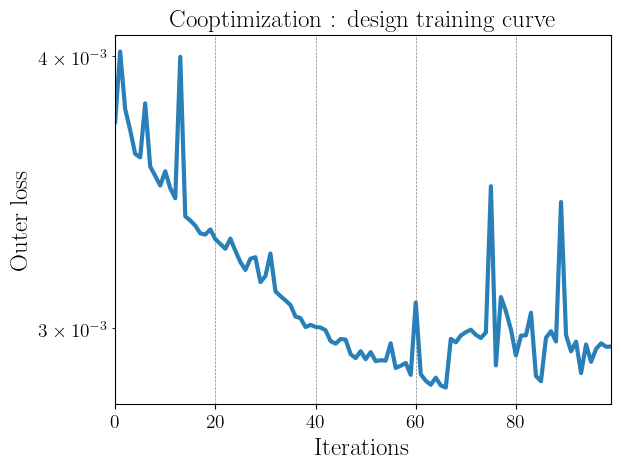

In [ ]:
with open(f"01282026_circular_structure_cooptimization_n_source_16_measure_idx_47_exp_param_fix_center.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

print(f"initial loss : {jnp.array(loss_record)[0]:.4e}")
print(f"minimum loss : {jnp.min(jnp.array(loss_record)):.4e}")

plt.plot(jnp.arange(len(loss_record)), jnp.array(loss_record), '-', lw=3, color=color_list[0])
# plt.title('Cooptimization : design training curve')
plt.yscale('log')
# plt.ylabel("Outer loss")
# plt.xlabel("Iterations")

# plt.legend()
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


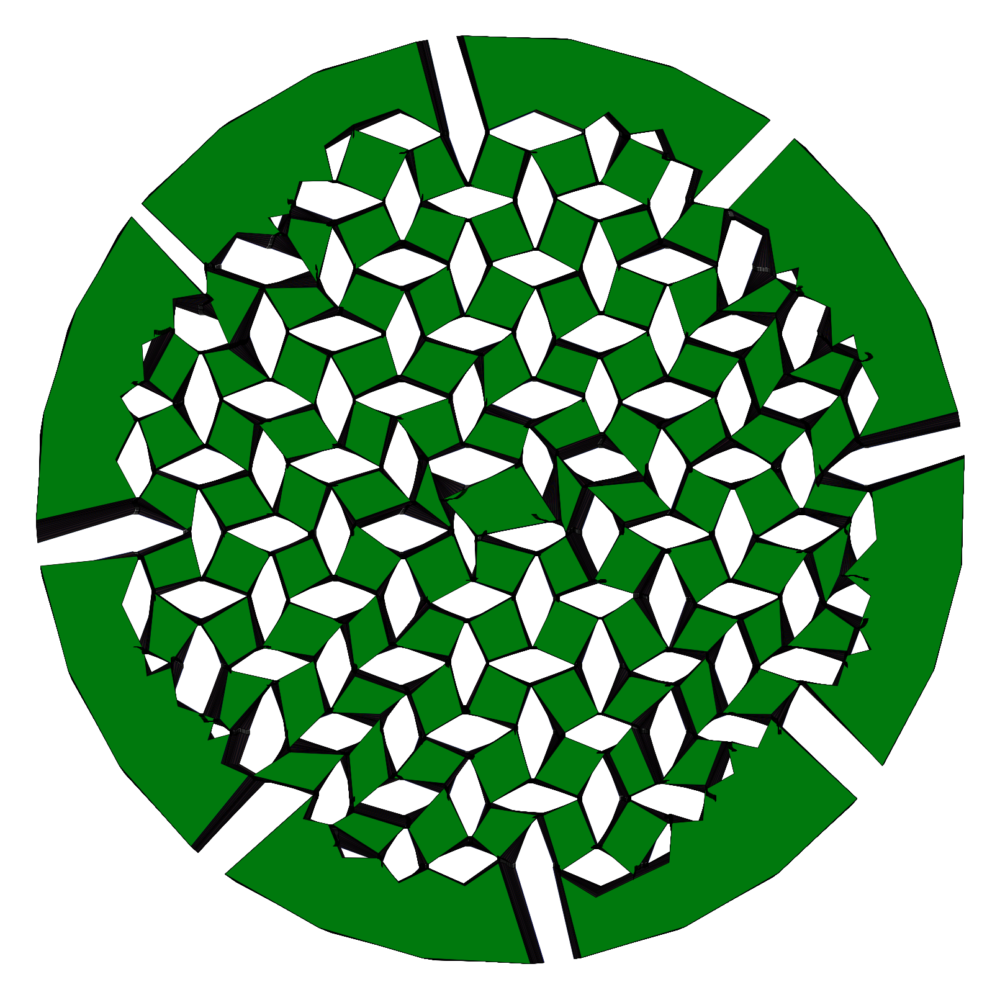

In [20]:
from blockymetamaterials.plotting_input import plot_geometry

hori_shifts_length = (n1_blocks+1) * n2_blocks * 2
geometry_data = []
for i in range(len(param_record)):
    meta_params = param_record[i]
    horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
    vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
    design_values = (horizontal_shifts, vertical_shifts)
    geometry_data.append({
            "block_centroids": geometry.block_centroids(*design_values),
            "centroid_node_vectors": geometry.centroid_node_vectors(*design_values),
            "bond_connectivity": geometry.bond_connectivity(),
            "deformed": False
        })

from blockymetamaterials.plotting_input import plot_multiple_geometries, compute_xy_limits

block_centroids_temp = geometry.block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = geometry.centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])
colors = ['b','g','r','c','m','y','k']
plot_multiple_geometries(
    geometry_data,
    colors=colors,
    figsize=(16,16),
    xlim=xlim, ylim=ylim
)
plt.axis("off")
plt.show()

initial loss : 2.9445e-03
minimum loss : 1.8711e-03


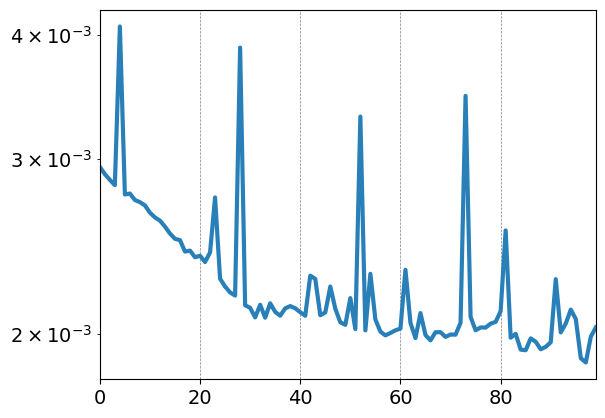

In [24]:
with open(f"01302026_circular_structure_cooptimization_n_source_16_measure_idx_48_exp_param_set_4_lr_0.1.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

print(f"initial loss : {jnp.array(loss_record)[0]:.4e}")
print(f"minimum loss : {jnp.min(jnp.array(loss_record)):.4e}")

plt.plot(jnp.arange(len(loss_record)), jnp.array(loss_record), '-', lw=3, color=color_list[0])
# plt.title('Cooptimization : design training curve')
plt.yscale('log')
# plt.ylabel("Outer loss")
# plt.xlabel("Iterations")
plt.savefig(f"Figure/circular_structure_loss_curve.eps")
# plt.legend()
plt.show()

97


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


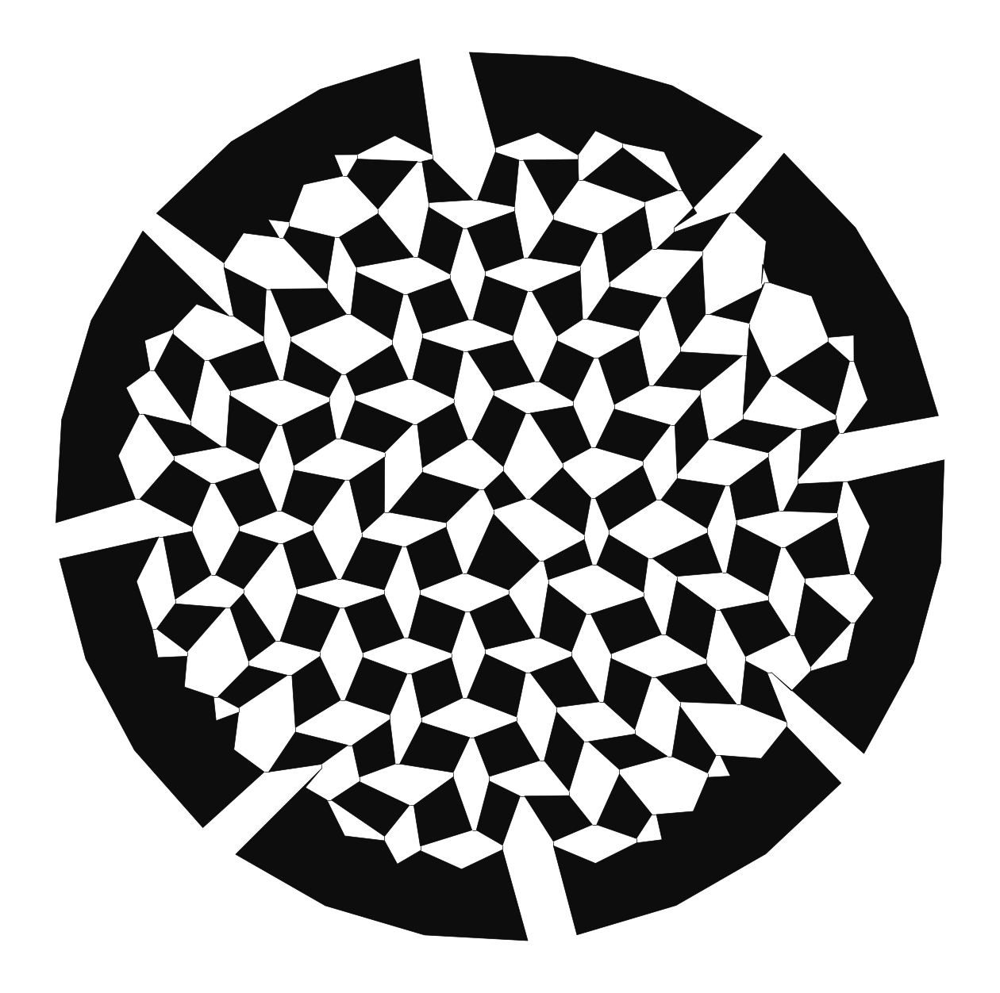

In [ ]:
from blockymetamaterials.plotting_input import plot_geometry, compute_xy_limits

opt_idx = jnp.argmin(jnp.array(loss_record))
print(opt_idx)
meta_params = param_record[opt_idx]
horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(centroid_node_vectors_temp, centroid_node_vectors_temp)], axis=0)
# from blockymetamaterials.plotting import generate_animation
# solution = input_data
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

fig, ax = plt.subplots(figsize=(16,16))
block_idx = jnp.concatenate( (geometry.blocks_inside, jnp.arange(geometry.n_quads, geometry.n_quads+geometry.n_piece)), dtype=int  )
colors = 'k'
plot_geometry(block_centroids_temp,
              centroid_node_vectors_temp,
              _bond_connectivity,
              color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
plt.savefig(f"Figure/122525_circular_structure_design_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_{n_source}_opt_design.eps")
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


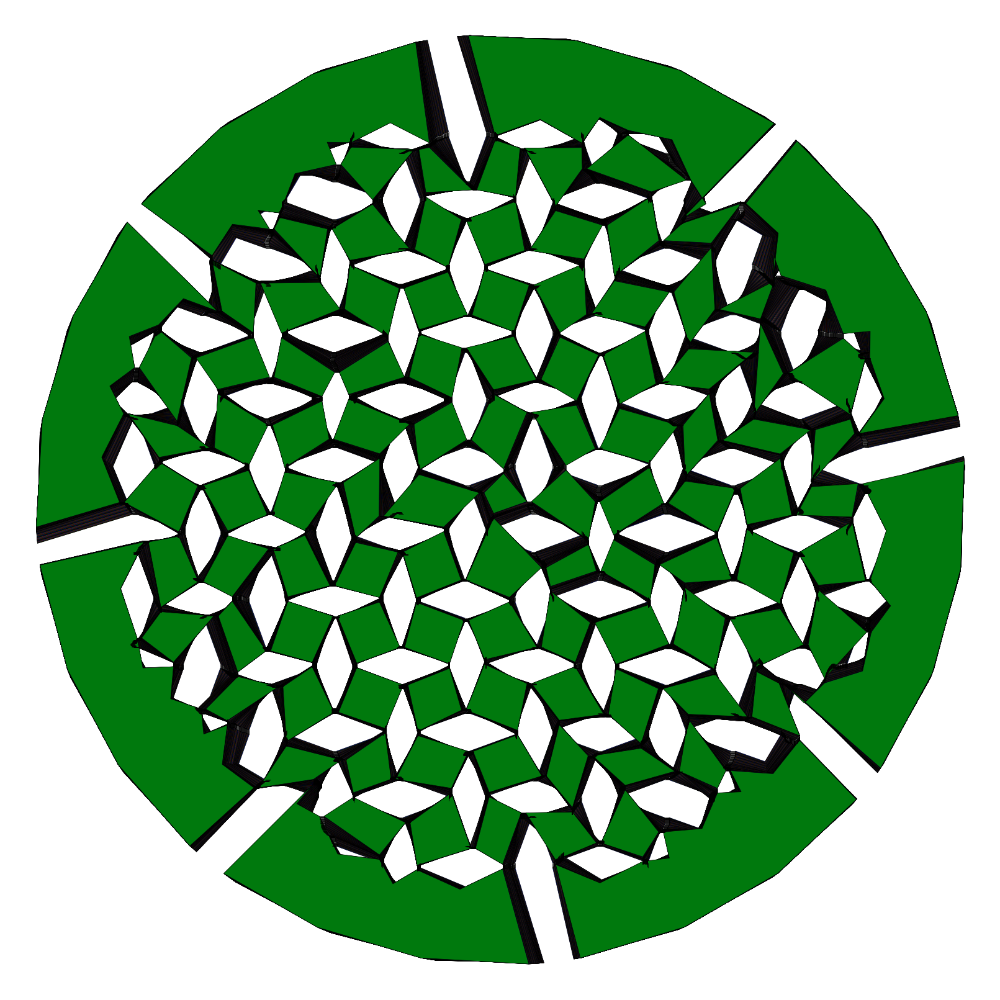

In [14]:
from blockymetamaterials.plotting_input import plot_geometry

hori_shifts_length = (n1_blocks+1) * n2_blocks * 2
geometry_data = []
for i in range(len(param_record)):
    meta_params = param_record[i]
    horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
    vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
    design_values = (horizontal_shifts, vertical_shifts)
    geometry_data.append({
            "block_centroids": geometry.block_centroids(*design_values),
            "centroid_node_vectors": geometry.centroid_node_vectors(*design_values),
            "bond_connectivity": geometry.bond_connectivity(),
            "deformed": False
        })

from blockymetamaterials.plotting_input import plot_multiple_geometries, compute_xy_limits

block_centroids_temp = geometry.block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = geometry.centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])
colors = ['b','g','r','c','m','y','k']
plot_multiple_geometries(
    geometry_data,
    colors=colors,
    figsize=(16,16),
    xlim=xlim, ylim=ylim
)
plt.axis("off")
plt.show()

In [9]:
# check gradient norm in previous 



from blockymetamaterials.utils import SolutionType, SolutionData, ControlParams, GeometricalParams, MechanicalParams, LigamentParams, ContactParams
# from blockymetamaterials.geometry import Geometry, QuadGeometry, compute_inertia, compute_edge_angles, compute_edge_lengths, DOFsInfo, QuadGeometry_Circle_InputSource, polygon_area, polygon_polar_moment
from blockymetamaterials.geometry import Geometry, QuadGeometry, compute_inertia, compute_edge_angles, compute_edge_lengths, DOFsInfo, QuadGeometry_Circle_InputSource, polygon_area, polygon_polar_moment
from blockymetamaterials.energy import build_strain_energy, kinetic_energy, ligament_energy, ligament_energy_linearized, build_contact_energy, combine_block_energies, compute_ligament_strains_history, constrain_energy
from typing import Any, Literal, Optional, List, Union, Tuple, Dict
import dataclasses
from dataclasses import dataclass
from itertools import combinations
from cooptimization import setup_dynamic_solver, setup_dynamic_solver_all

import diffrax
from typing import Callable, Optional, Union
from flax import linen as nn
from flax.training.train_state import TrainState
import optax
from jax_md.quantity import force
import equinox as eqx
from tqdm import trange, tqdm

def build_viscous_damping(
        geometry: Geometry,
        damped_DOF_ids: jnp.ndarray,
        free_DOF_ids: jnp.ndarray,
        constrained_DOF_ids: jnp.ndarray,
        all_DOF_ids: jnp.ndarray):

    # This is to ensure correct shape of loading vector when damping is either a scalar or an array of shape (n_damped_blocks, 3)
    reshaping_array = jnp.ones((damped_DOF_ids.shape[0]//3, 3))

    def loading_fn(state, t, damping: jnp.ndarray):
        _, velocity = state
        loading_vector = jnp.zeros((len(all_DOF_ids),))
        loading_vector = loading_vector.at[damped_DOF_ids].set(
            (damping * reshaping_array).reshape(damped_DOF_ids.shape)
        )
        loading_vector = loading_vector[free_DOF_ids]

        return -loading_vector * velocity

    return loading_fn


def build_loading(
        geometry: Geometry,
        loaded_DOF_ids: jnp.ndarray,
        loading_fn: Callable,
        free_DOF_ids: jnp.ndarray,
        constrained_DOF_ids: jnp.ndarray,
        all_DOF_ids: jnp.ndarray):

    def global_loading_fn(state, t, loading_params: Dict):

        loading_vector = jnp.zeros((len(all_DOF_ids),))
        
        loading_vector = loading_vector.at[loaded_DOF_ids].set(
            loading_fn(state, t, **loading_params)
        )
        loading_vector = loading_vector[free_DOF_ids]  # Reduce loading vector to the free DOFs

        return loading_vector

    return global_loading_fn


def build_constrained_kinematics(
        geometry: Geometry,
        constrained_block_DOF_pairs: jnp.ndarray,
        free_DOF_ids: jnp.ndarray,
        constrained_DOF_ids: jnp.ndarray,
        all_DOF_ids: jnp.ndarray,
        constrained_DOFs_fn: Callable = lambda t,
        **kwargs: 0):

    def constrained_kinematics(free_DOFs: jnp.ndarray, t, constraint_params: Dict = dict()):

        all_DOFs = jnp.zeros((len(all_DOF_ids),))
        # Assign imposed displacements along the constrained DOFs
        if len(constrained_DOF_ids) != 0:
            all_DOFs = all_DOFs.at[constrained_DOF_ids].set(
                constrained_DOFs_fn(t, **constraint_params)
            )

        # Simply assign the free_DOFs along the free DOFs (this acts as the identity operator)
        all_DOFs = all_DOFs.at[free_DOF_ids].set(
            free_DOFs
        )
        return all_DOFs.reshape((geometry.n_blocks, 3))

    return constrained_kinematics

def build_RHS(energy_fn: Callable, loading_fn: Callable):

    potential_force = force(energy_fn)

    @jit
    def rhs(t, state: jnp.ndarray, args):
        control_params, inertia = args
        loading_params = control_params.loading_params
        damping = control_params.mechanical_params.damping
        displacement, velocity = state

        dxdt = jnp.array([
            velocity,
            (potential_force(displacement, t, control_params) + loading_fn(state, t, loading_params, damping)) / inertia
        ])
        return dxdt

    return rhs

def setup_dynamic_solver(
        geometry: Geometry,
        energy_fn: Callable,
        free_DOF_ids: jnp.ndarray,
        constrained_DOF_ids: jnp.ndarray,
        all_DOF_ids: jnp.ndarray,
        loaded_DOF_ids: Optional[jnp.ndarray] = None,
        loading_fn: Optional[Callable] = None,
        constrained_block_DOF_pairs: jnp.ndarray = jnp.array([]),
        constrained_DOFs_fn: Callable = lambda t: 0,
        damped_DOF_ids: Optional[jnp.ndarray] = None,
        rtol: float = 1e-8,
        atol: float = 1e-8):

    # Handle constraints
    kinematics = build_constrained_kinematics(
        geometry=geometry,
        constrained_block_DOF_pairs=constrained_block_DOF_pairs,
        constrained_DOFs_fn=constrained_DOFs_fn,
        free_DOF_ids=free_DOF_ids,
        constrained_DOF_ids=constrained_DOF_ids,
        all_DOF_ids=all_DOF_ids
    )
    constrained_energy = constrain_energy(energy_fn=energy_fn, constrained_kinematics=kinematics)

    # Canonicalize loading function
    if loaded_DOF_ids is not None and loading_fn is not None:
        _loading_fn = build_loading(
            geometry=geometry,
            loaded_DOF_ids=loaded_DOF_ids,
            loading_fn=loading_fn,
            free_DOF_ids=free_DOF_ids,
            constrained_DOF_ids=constrained_DOF_ids,
            all_DOF_ids=all_DOF_ids
        )
    else:
        def _loading_fn(state, t, loading_params): return 0

    # Canonicalize damping
    if damped_DOF_ids is not None:
        damping_fn = build_viscous_damping(
            geometry=geometry,
            damped_DOF_ids=damped_DOF_ids,
            free_DOF_ids=free_DOF_ids,
            constrained_DOF_ids=constrained_DOF_ids,
            all_DOF_ids=all_DOF_ids
        )
    else:
        def damping_fn(state, t, damping): return 0

    # Combine all loading functions
    def loading_fn_total(state, t, loading_params, damping):
        return _loading_fn(state, t, loading_params) + damping_fn(state, t, damping)

    rhs = build_RHS(energy_fn=constrained_energy, loading_fn=loading_fn_total)

    # Retrieve free DOFs from constraints info (this information is assumed to be static)
    # free_DOF_ids, constrained_DOF_ids, all_DOF_ids = DOFsInfo(geometry.n_blocks, constrained_block_DOF_pairs)

    # Utility functions to reconstruct the full state array from the solution of the free DOFs
    displacement_history_fn = vmap(kinematics, in_axes=(0, 0, None)) #-> TRY OBTAIN DISPLACEMENTS OF ALL BLOCKS (N,x) ,
    jac_kinematics = jacobian(kinematics, argnums=(0, 1))
    
    def velocity_fn(free_DOFs, free_DOFs_dot, t, constraint_params):
        du_dfree, du_dt = jac_kinematics(free_DOFs, t, constraint_params)
        return du_dfree @ free_DOFs_dot + du_dt

    jac_velocity = jacobian(velocity_fn, argnums=(0, 1, 2))
    def acceleration_fn(free_DOFs_total, t, control_params, inertia):
        # print(free_DOFs_total.shape)
        free_DOFs = free_DOFs_total[0,:]
        free_DOFs_dot = free_DOFs_total[1,:]
    
        dvdx, dvdx_dot, dvdt = jac_velocity(free_DOFs, free_DOFs_dot, t, control_params.constraint_params)
        args = (control_params, inertia)
        acc_freeDOFs = rhs(t, free_DOFs_total, args)[1,:]
        return dvdx @ free_DOFs_dot + dvdx_dot @ acc_freeDOFs + dvdt

    velocity_history_fn = vmap(velocity_fn, in_axes=(0, 0, 0, None))
    acceleration_history_fn = vmap(acceleration_fn, in_axes=(0, 0, None, None))

    def solve_dynamics(state0: jnp.ndarray, timepoints: jnp.ndarray, control_params: ControlParams):
        
        # Reduce state0 and inertia to the free DOFs
        _state0 = state0.reshape((2, geometry.n_blocks * 3))[:, free_DOF_ids]
        
        if control_params.mechanical_params.inertia is None:
            _inertia = compute_inertia(
                vertices=control_params.geometrical_params.centroid_node_vectors,
                density=control_params.mechanical_params.density
            ).reshape((geometry.n_blocks * 3,))[free_DOF_ids]
        else:
            _inertia = control_params.mechanical_params.inertia.reshape(geometry.n_blocks * 3)[free_DOF_ids]

        # Solve ODE
        solver = diffrax.Tsit5()
        # solver = diffrax.Kvaerno5()
        saveat = diffrax.SaveAt(ts=timepoints)

        solution = diffrax.diffeqsolve(diffrax.ODETerm(rhs), solver,
                                                timepoints[0], timepoints[-1], dt0=None, y0=_state0, 
                                                stepsize_controller=diffrax.PIDController(rtol=rtol, atol=atol),
                                                saveat=saveat,
                                                args=(control_params, _inertia),
                                                max_steps=1000000) 

        free_DOFs_solution = solution.ys
        
        velocity_history = velocity_history_fn(
            free_DOFs_solution[:, 0, :],
            free_DOFs_solution[:, 1, :],
            timepoints,
            control_params.constraint_params
        )

        acceleration_history = acceleration_history_fn(
            free_DOFs_solution[:, 0:2, :],
            timepoints,
            control_params,
            _inertia
        )

        measure_idx = jnp.array(args.measure_idx)
        n_measure = measure_idx.shape[0]
        solution = jnp.zeros((len(timepoints), n_measure, 3))

        solution = solution.at[:,:,:2].set( acceleration_history[:,measure_idx,0:2] )
        solution = solution.at[:,:,-1].set( velocity_history[:,measure_idx,-1] )
        # solution = velocity_history[:,measure_idx,:].squeeze() # (len(timepoints), 3)
        solution = solution.reshape((len(timepoints), -1))
    
        print( "solution shape : ", solution.shape )
        return solution

    return solve_dynamics

class minmax_scaler():
  def __init__(self, input_data, output_data):
    # assume that 
    self.data_max = jnp.max(input_data, axis=(0, 1), keepdims=True)
    self.data_min = jnp.min(input_data, axis=(0, 1), keepdims=True)
    print(self.data_max.shape, self.data_min.shape)

    self.output_data_max = jnp.max(output_data, axis=(0, 1), keepdims=True)
    self.output_data_min = jnp.min(output_data, axis=(0, 1), keepdims=True)
    print(self.output_data_max.shape, self.output_data_min.shape)

  def transform(self, input_data, output_data):
    data_normalized = 2.0 * ( input_data - self.data_min ) / ( self.data_max - self.data_min ) - 1.0  # Add a small value to avoid division by zero
    output_normalized = (output_data - self.output_data_min) / (self.output_data_max - self.output_data_min)
    return data_normalized, output_normalized
  
  def inverse_transform(self, data_normalized, output_normalized):
    data_original = (data_normalized + 1.0) * (self.data_max - self.data_min) / 2.0 + self.data_min
    output_original = output_normalized * (self.output_data_max - self.output_data_min) + self.output_data_min
    return data_original, output_original

  def information(self):
    print("data min : ", self.data_min)
    print("data max : ", self.data_max)
    print("test data min : ", self.output_data_min)
    print("test data max : ", self.output_data_max)
    return self.data_min, self.data_max, self.output_data_min, self.output_data_max

class TimeSeriesCNN(nn.Module):
    features: int = 64
    output_features: int = 2

    @nn.compact
    def __call__(self, x):
        # Input shape: (batch_size, time_steps, 2)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.features, kernel_size=(3,), padding='SAME')(x)
        x = nn.relu(x)
        x = nn.Conv(self.output_features, kernel_size=(1,), padding='SAME')(x)  # Final output: 2 channels
        return x  # Shape: (batch_size, time_steps, 2)
    

n1_blocks = 15
n2_blocks = 15
n_piece = 8
n_source = n_piece * 2
spacing = 15. + 0.075*15.  # 1.0  # 15 mm
hinge_length = 0.075*15.  # Same as bond length
initial_angle = 25.0*jnp.pi/180

horizontal_shifts, vertical_shifts = QuadGeometry_Circle_InputSource(n1_blocks, n2_blocks, spacing=spacing, bond_length=hinge_length, n_piece=n_piece).get_design_from_rotated_square(
    angle=initial_angle,
)  # Initial design

# use previous parameters
# Mechanical params
k_stretch = 4.00  # stretching stiffness 120. N/mm
k_shear = k_stretch * 2.1e-01 # shearing stiffness 1.19 N/mm
k_rot = k_stretch * 2.6902e-03 * 20.0 # rotational stiffness 1.50 Nmm
density = 3.2325226e-08 # 0.03859661 * 1e-6  # Mg/mm^2

# Dynamic loading (I don't use these parameters)----------
amplitude = 0.5 * spacing  # 0.5 * spacing default 
loading_rate = 30.0 # jnp.array([30., 0., 20., 20., 20.])  #  Hz loading frequency for dynamic input
input_delay = 0.1*30.0**-1 * jnp.ones((n1_blocks,))
#---------------------------------------------------------
min_angle=-15*jnp.pi/180
cutoff_angle=-10*jnp.pi/180

simulation_time = 1.0
n_timepoints = 200
bond_length = hinge_length
linearized_strains = False
use_contact = False
k_contact = k_rot

geometry = QuadGeometry_Circle_InputSource(
    n1_blocks=n1_blocks,
    n2_blocks=n2_blocks,
    spacing=spacing,
    bond_length=bond_length
)

block_centroids, centroid_node_vectors, bond_connectivity, reference_bond_vectors = geometry.get_parametrization()
_bond_connectivity = bond_connectivity()  # Compute bond connectivity once as it is constant
_reference_bond_vectors = reference_bond_vectors(horizontal_shifts, vertical_shifts)  # Compute reference bond vectors once as they are constant

k_stretch_arr = k_stretch * jnp.ones((_bond_connectivity.shape[0],))  # stretching stiffness 120. N/mm
k_shear_arr = k_shear * jnp.ones((_bond_connectivity.shape[0],)) # shearing stiffness 1.19 N/mm
k_rot_arr = k_rot * jnp.ones((_bond_connectivity.shape[0],)) # rotational stiffness 1.50 Nmm

# NOTE: Damping is assumed to be the same for all blocks as it is small enough that the inertia change during optimization is negligible.
# The reference is taken to be zero angle rotated square geometry.
# 0.36125, 0.02175026 = mass and inertia of a single square of zero angle and unitary spacing and density and 0.15 bond length.
dampall = 0.624118 
dampxy = 0.884512
damprot = 0.85392

damping_params = jnp.array([dampall * 0.186, dampxy * 0.36125, damprot * 0.02175026])
print( "initial damping params : ", damping_params )
damping = damping_params[0] * jnp.array([
    2 * (damping_params[1] * density * spacing**2 * k_shear)**0.5,
    2 * (damping_params[1] * density * spacing**2 * k_shear)**0.5,
    2 * (damping_params[2] * density * spacing**4 * k_rot)**0.5
]) * jnp.ones((geometry.n_blocks, 3))


# Damping
damped_blocks = jnp.arange(geometry.n_blocks)

n_excited_blocks = geometry.n_piece
idx_input_source = jnp.arange(geometry.n_quads,geometry.n_quads+n_excited_blocks)
driven_block_DOF_pairs = jnp.array([
    jnp.tile(
        idx_input_source,
        2),
    jnp.array([0]*n_excited_blocks + [1]*n_excited_blocks)
]).T
print("driven_block_DOF_pairs", driven_block_DOF_pairs)


block_to_inner = -jnp.ones(geometry.n1_blocks * geometry.n2_blocks, dtype=int)
block_to_inner = block_to_inner.at[geometry.blocks_inside].set(jnp.arange(len(geometry.blocks_inside)))

clamped_idx = block_to_inner[ (geometry.n1_blocks*geometry.n2_blocks)//2 ]
print("clamped idx : ", clamped_idx)
n_clamped_blocks = 1
clamped_block_DOF_pairs = jnp.array([
    jnp.tile(
        jnp.array([clamped_idx]),
        3),
    jnp.array([0]*n_clamped_blocks + [1]*n_clamped_blocks + [2]*n_clamped_blocks)
]).T


constrained_block_DOF_pairs = jnp.concatenate(
    [clamped_block_DOF_pairs]
)

# constrained_block_DOF_pairs = jnp.zeros((0,2), dtype=int)

clamped_blocks_ids = jnp.unique(
    jnp.concatenate([
        clamped_block_DOF_pairs
    ])[:, 0]
)

driven_blocks_ids = jnp.unique( driven_block_DOF_pairs[:, 0] )
constrained_DOFs_loading_vector = jnp.zeros((len(constrained_block_DOF_pairs),))

allowed_blocks = jnp.arange( geometry.n_quads+n_excited_blocks )
moving_blocks_ids = allowed_blocks
moving_blocks_ids = jnp.delete( allowed_blocks, clamped_blocks_ids ) # or jnp.delete( jnp.arange(geometry.n_blocks), constrained_blocks_ids )

loaded_DOF_ids = jnp.array([block_id * 3 + DOF_id for block_id, DOF_id in driven_block_DOF_pairs])

def pulse(t, amplitude, loading_rate):
    return amplitude * jnp.where(
        (t > 0.) & (t < loading_rate**-1),
        (1 - jnp.cos(2*jnp.pi * loading_rate * t))/2,
        0.
    )
    
excited_blocks_fn = None

if excited_blocks_fn is None:
    # Apply sinthetic pulse loading
    # NOTE: This is used for optimization.
    def constrained_DOFs_fn(t, amplitude, loading_rate, input_delay):
        return 0.0 * constrained_DOFs_loading_vector
else:
    # Apply user-defined loading
    # NOTE: This can be used to apply the experimental loading
    def constrained_DOFs_fn(t, **kwargs):
        return excited_blocks_fn(t) * constrained_DOFs_loading_vector
    
# Construct strain energy
strain_energy = build_strain_energy(
    bond_connectivity=_bond_connectivity,
    bond_energy_fn=ligament_energy_linearized if linearized_strains else ligament_energy,
)
contact_energy = build_contact_energy(bond_connectivity=_bond_connectivity)
potential_energy = combine_block_energies(strain_energy, contact_energy) if use_contact else strain_energy

atol = 1e-4
rtol = 1e-4

free_DOF_ids, constrained_DOF_ids, all_DOF_ids = DOFsInfo(geometry.n_blocks, constrained_block_DOF_pairs)
damped_DOF_ids = jnp.concatenate([jnp.arange(block_id * 3, (block_id + 1) * 3) for block_id in damped_blocks])

target_size = (1, 1)
target_shift = (0, 0)
ts = jnp.linspace(0, simulation_time, n_timepoints)

target_blocks = jnp.array([
    j * n1_blocks + i
    for i in range((n1_blocks-target_size[0])//2 + target_shift[0], (n1_blocks+target_size[0])//2 + target_shift[0])
    for j in range((n2_blocks-target_size[1])//2 + target_shift[1], (n2_blocks+target_size[1])//2 + target_shift[1])
])

vertices = centroid_node_vectors(horizontal_shifts, vertical_shifts)
areas = jnp.stack([ polygon_area(vertice) for vertice in vertices ], axis=0)
area_moments = jnp.stack([ polygon_polar_moment(vertice) for vertice in vertices ], axis=0)

density_arr = jnp.ones( (len(areas)) ) * density
density_arr = density_arr.at[geometry.n_quads:].set(2.0 * density) # shell blocks are heavier than inner blocks
target_blocks = 48
density_arr = density_arr.at[target_blocks].set( density + 0.007301278265064265 * 1e-6  )

translational_inertia = density_arr * areas
rotational_inertia = density_arr * area_moments

# translational_inertia = density * areas
# rotational_inertia = density * area_moments

_inertia = jnp.column_stack((translational_inertia, translational_inertia, rotational_inertia))

@eqx.filter_jit
def forward_problem(inputs, output_data, free_DOF_ids, constrained_DOF_ids, all_DOF_ids):
    
    # Analysis params
    timepoints = jnp.linspace(0.0, simulation_time, n_timepoints)
    horizontal_shifts, vertical_shifts = inputs

    def loading_fn(state, t, **kwargs):
        return vmap(jnp.interp, in_axes=(None,None,1))( t, timepoints, output_data )

    # Setup solver
    solve_dynamics = setup_dynamic_solver_all(
        geometry=geometry,
        energy_fn=potential_energy,
        # add new arguments
        loaded_DOF_ids=loaded_DOF_ids,
        loading_fn=loading_fn,
        constrained_block_DOF_pairs=constrained_block_DOF_pairs,
        constrained_DOFs_fn=constrained_DOFs_fn,
        damped_DOF_ids=damped_DOF_ids,
        free_DOF_ids=free_DOF_ids,
        constrained_DOF_ids=constrained_DOF_ids,
        all_DOF_ids=all_DOF_ids,
        atol=atol,
        rtol=rtol,
    )

    # Define control params
    control_params = ControlParams(
        geometrical_params=GeometricalParams(
            block_centroids=block_centroids(horizontal_shifts, vertical_shifts),
            centroid_node_vectors=centroid_node_vectors(horizontal_shifts, vertical_shifts),
        ),
        mechanical_params=MechanicalParams(
            bond_params=LigamentParams(
                k_stretch=k_stretch_arr,
                k_shear=k_shear_arr,
                k_rot=k_rot_arr,
                reference_vector=_reference_bond_vectors,
            ),
            density=density,
            damping=damping,
            contact_params=ContactParams(
                k_contact=k_contact,
                min_angle=min_angle,
                cutoff_angle=cutoff_angle,
            ),
            inertia=_inertia
        ),
        constraint_params=dict( # I don't use this parameter
            amplitude=amplitude,
            loading_rate=loading_rate,
            input_delay=input_delay,
        ),
        loading_params=dict( # I don't use this parameter
            amplitude=amplitude,
            loading_rate=loading_rate,
            input_delay=input_delay,
        ),
    )

    # Initial conditions
    # state0 = jnp.zeros((2, geometry.n_blocks, 3))
    state0 = 1e-10 * jnp.ones((2, geometry.n_blocks, 3))

    start = time.time()
    # Solve dynamics
    solution = solve_dynamics(
        state0=state0,
        timepoints=timepoints,
        control_params=control_params,
    )
    print("duration : ", time.time() - start)
    
    return solution


key = random.PRNGKey(0)
N = 300


measure_idx = jnp.array([48])
n_measure = measure_idx.shape[0]

filename = f"012326_circular_structure_dataset_n_source_8_exp_param_free_set_4.pickle"
# filename = f"012326_circular_structure_dataset_n_source_8_exp_param_multi_source_normal_2.pickle"

print("Checking for data file at:", filename)
with open(filename, "rb") as f:
    data_dict = pickle.load(f)

print("input data shape : ", data_dict["input_data"].shape)
input_data = jnp.zeros_like(data_dict["input_data"][:,:,2,measure_idx,:].squeeze()) # (N, time_steps, 3)
input_data = input_data.at[:,:,0:2].set(data_dict["input_data"][:,:,2,measure_idx,0:2].squeeze()) # (N, time_steps, 2)
input_data = input_data.at[:,:,2].set(data_dict["input_data"][:,:,1,measure_idx,2].squeeze()) # (N, time_steps, 2)
output_data = data_dict["output_data"]

angle_cut = 360. / geometry.n_piece
def map_func(output_data_single):
    output_data_temp = jnp.zeros( (n_timepoints, 2*n_excited_blocks) ) # (ts, boundary blocks * 2)
    for i in range(n_excited_blocks):
        normal_angle = (+180 - angle_cut/2. - angle_cut * i) * jnp.pi / 180.
        output_data_temp = output_data_temp.at[:,i].set( output_data_single[:,i] * jnp.cos(normal_angle) )
        output_data_temp = output_data_temp.at[:,n_excited_blocks+i].set( output_data_single[:,i] * jnp.sin(normal_angle) )
    return output_data_temp
output_data_all = vmap(map_func)(output_data)

test_N = input_data.shape[0] // 10 # 10 % of total data will be used as test data
test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=input_data.shape[0])

mask = jnp.ones(input_data.shape[0], dtype=bool).at[test_idx].set(False)

training_input_data = input_data[mask]
training_output_data = output_data[mask]

test_input_data = input_data[test_idx]
test_output_data = output_data[test_idx]

print("input data size : ", input_data.shape)
print("output data size : ", output_data.shape)

mm_scaler = minmax_scaler(training_input_data, training_output_data)
train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)

model = TimeSeriesCNN(output_features=n_piece)
init_params = model.init(key, input_data)
preds = model.apply(init_params, input_data)

def inner_loss(params, outer_parameters, data):
  inputs, targets = data
  predictions = model.apply(params, inputs)
  mse = jnp.mean((predictions - targets)**2)  # this is L(phi_prime, D^{tr}_i)
  return mse

class setting:
    def __init__(self):
        self.innerlr = 0.01
        self.outerlr = 0.1
        self.inneriter = 20
        self.outeriter = 20
        self.measure_idx = [48]

args = setting()

maxiter = 20
tol = 1e-7
inner_solver = OptaxSolver(opt=optax.adam(args.innerlr),
                            fun=inner_loss,
                            maxiter=args.inneriter,
                            tol=1e-12,
                            implicit_diff=True,
                            implicit_diff_solve=Partial(
                            linear_solve.solve_cg,
                            maxiter=maxiter, # 5
                            tol=tol),
                            )

hori_shifts_length = (n1_blocks+1) * n2_blocks * 2

nest_forward_problem = lambda inputs : vmap(forward_problem, in_axes=(None,0,None,None,None))(inputs, output_data_all, free_DOF_ids, constrained_DOF_ids, all_DOF_ids)
def outer_loss(meta_params):

    horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
    vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
    inputs = (horizontal_shifts, vertical_shifts)
    input_data = nest_forward_problem(inputs)
    # print("input_data shape : ", input_data.shape)

    training_input_data = input_data[mask]
    training_output_data = output_data[mask]
    test_input_data = input_data[test_idx]
    test_output_data = output_data[test_idx]
    train_data_normalized, train_output_normalized = mm_scaler.transform(training_input_data, training_output_data)
    test_data_normalized, test_output_normalized = mm_scaler.transform(test_input_data, test_output_data)
    # iter_data = dataloader((train_data_normalized, train_output_normalized), batch_size)
    # test_data = (test_data_normalized, test_output_normalized)

    model = TimeSeriesCNN(output_features=n_piece)
    nn_params = model.init(key, input_data)

    in_params_sol, state = inner_solver.run(
        nn_params, 
        meta_params,
        (train_data_normalized, train_output_normalized)
        ) 

    # prediction = vmap(model.forward)(in_params_sol, samples_test)
    prediction = model.apply(in_params_sol, test_data_normalized)
    loss = jnp.mean((prediction - test_output_normalized)**2)  # L(\phi, D^{te}_i)

    # Return (loss, aux) so jax.grad(..., has_aux=True) can backprop through inner_solver.run (implicit diff needs aux in the graph)
    return loss, (in_params_sol, state)


initial damping params :  [0.11608595 0.31952996 0.01857298]
driven_block_DOF_pairs [[ 97   0]
 [ 98   0]
 [ 99   0]
 [100   0]
 [101   0]
 [102   0]
 [103   0]
 [104   0]
 [ 97   1]
 [ 98   1]
 [ 99   1]
 [100   1]
 [101   1]
 [102   1]
 [103   1]
 [104   1]]
clamped idx :  48
Checking for data file at: 012326_circular_structure_dataset_n_source_8_exp_param_free_set_4.pickle
input data shape :  (300, 200, 3, 105, 3)
input data size :  (300, 200, 3)
output data size :  (300, 200, 8)
(1, 1, 3) (1, 1, 3)
(1, 1, 8) (1, 1, 8)


In [ ]:

with open(f"01302026_circular_structure_cooptimization_n_source_16_measure_idx_48_exp_param_set_4_lr_0.1.pickle", "rb") as f:
    record_dict = pickle.load(f)

param_record = record_dict["design_record"]
in_param_record = record_dict["nn_record"]
loss_record = record_dict["loss_record"]

print(f"initial loss : {jnp.array(loss_record)[0]:.4e}")
print(f"minimum loss : {jnp.min(jnp.array(loss_record)):.4e}")

plt.plot(jnp.arange(len(loss_record)), jnp.array(loss_record), '-', lw=3, color=color_list[0])
# plt.title('Cooptimization : design training curve')
plt.yscale('log')
# plt.ylabel("Outer loss")
# plt.xlabel("Iterations")
plt.savefig(f"Figure/circular_structure_loss_curve.eps")
# plt.legend()
plt.show()

opt_idx = jnp.argmin(jnp.array(loss_record))
meta_params = param_record[opt_idx]
horizontal_shifts = meta_params[:hori_shifts_length].reshape((n1_blocks+1, n2_blocks, 2))
vertical_shifts = meta_params[hori_shifts_length:].reshape((n1_blocks, n2_blocks+1, 2))
inputs = (horizontal_shifts, vertical_shifts)

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)

shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(centroid_node_vectors_temp, centroid_node_vectors_temp)], axis=0)
# from blockymetamaterials.plotting import generate_animation
# solution = input_data
xlim, ylim = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

fig, ax = plt.subplots(figsize=(16,16))
block_idx = jnp.concatenate( (geometry.blocks_inside, jnp.arange(geometry.n_quads, geometry.n_quads+geometry.n_piece)), dtype=int  )
colors = 'k'
plot_geometry(block_centroids_temp,
              centroid_node_vectors_temp,
              _bond_connectivity,
              color=colors, ax=ax)
ax.axis("equal")
ax.axis("off")
# plt.savefig(f"Figure/122525_circular_structure_design_n1_blocks_{n1_blocks}_n2_blocks_{n2_blocks}_n_source_{n_source}_opt_design.eps")
plt.show()


# # horizontal_shifts, vertical_shifts = inputs
# meta_params = jnp.concatenate( (horizontal_shifts.flatten(), vertical_shifts.flatten()))
# print("meta params shape : ", meta_params.shape)

# # Compute gradient of outer loss w.r.t. meta_params (no optimization)
# grad_outer_loss = jax.grad(outer_loss)
# grad_meta_params = grad_outer_loss(meta_params)

# print("grad_meta_params shape:", grad_meta_params.shape)
# print("gradient norm:", float(jnp.sqrt(jnp.sum(grad_meta_params**2))))


# loss_value = outer_loss(meta_params)
# print("outer loss at current meta_params:", float(loss_value))

In [20]:
solution_all = vmap(forward_problem, in_axes=(None,0,None,None,None))(inputs, output_data_all, free_DOF_ids, constrained_DOF_ids, all_DOF_ids)

results_dict = {
    "output_data": output_data,
    "input_data": solution_all,
    "horizontal_shifts": horizontal_shifts,
    "vertical_shifts": vertical_shifts,
}

with open(f"01302026_simulation_results_n_source_16_measure_idx_48_exp_param_set_4_lr_0.1.pickle", "wb") as f:
    pickle.dump(results_dict, f)


duration :  0.364757776260376


In [27]:
x_max, x_min, y_max, y_min

(Array(6.33624283, dtype=float64),
 Array(-6.15087397, dtype=float64),
 Array(6.19005544, dtype=float64),
 Array(-5.89329897, dtype=float64))

In [ ]:
shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim_structure, ylim_structure = compute_xy_limits(
    shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

print(xlim_structure, ylim_structure[0])

[ -7.86449211 233.43132766] [ -7.84850799 233.53939408]


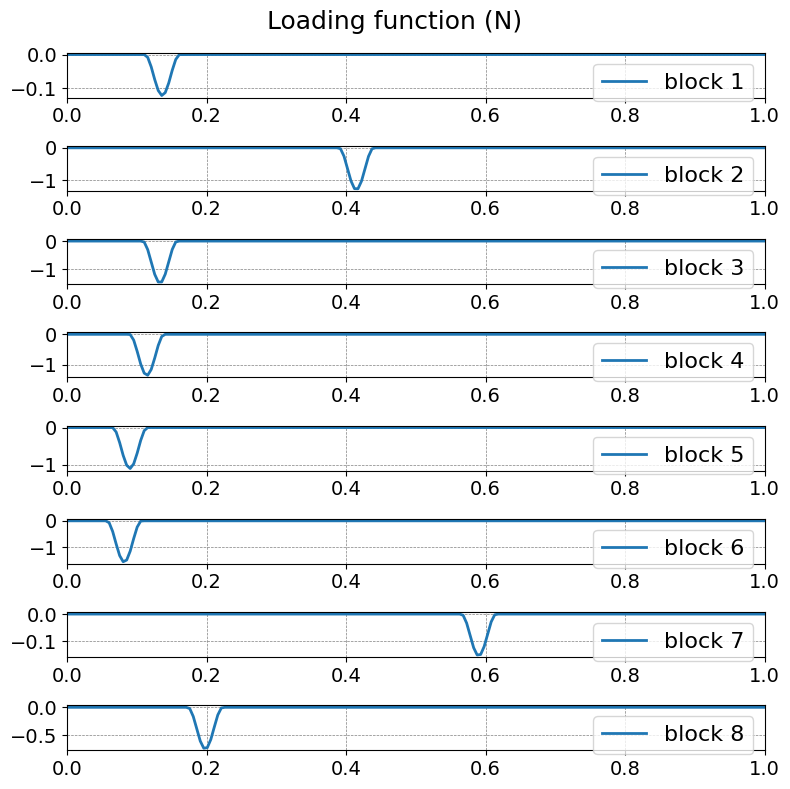

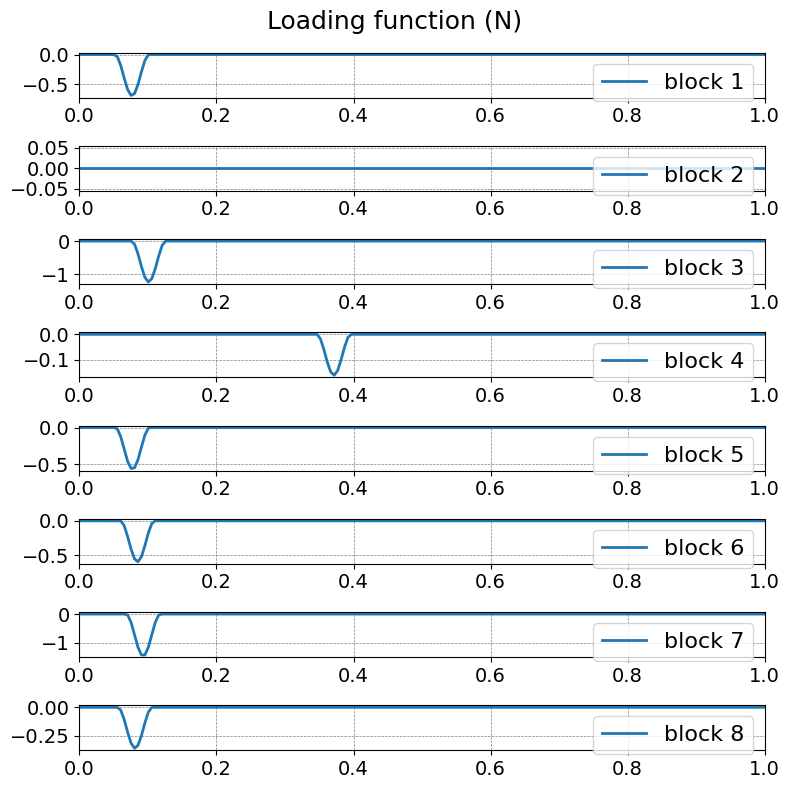

In [34]:
for count in range(2):
    output_data_temp = output_data[count]
    plt.figure(figsize=(8,8))
    for i in range(n_excited_blocks):
        plt.subplot(n_excited_blocks,1,i+1)
        plt.plot(ts, output_data_temp[:,i], label=f"block {i+1}")
        # plt.ylim(-max_value, 0.0)
        # plt.ylabel("Loading (N)")
        plt.legend()
    plt.suptitle("Loading function (N)")
    plt.tight_layout()
    plt.show()

0
32
21
21
16
31
0
32


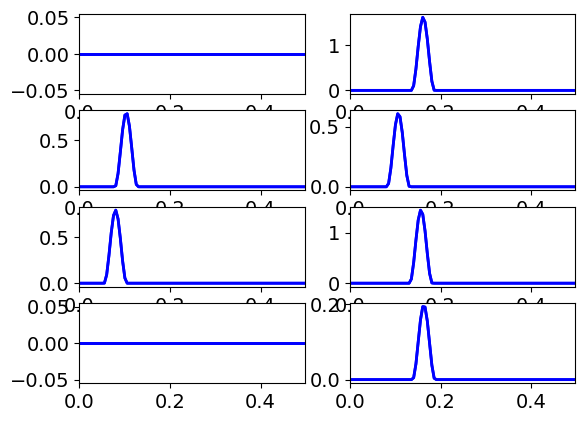

In [16]:
num = 26 # number of test data
R2D = 180. / jnp.pi

test_input_data = input_data[test_idx]
test_output_data = output_data[test_idx]
test_input_data_opt = input_data_opt[test_idx]
test_output_data_opt = output_data_opt[test_idx]
step_set = []

N = 100
for j in range(n_piece):
    plt.subplot(n_piece // 2, 2, 1 + j)
    plt.plot(ts[:N], -test_output_data[num, :N, j], "b-", label="True")
    # Find the index of the peak (maximum value)
    peak_idx = jnp.argmax(-test_output_data[num, :N, j])
    print(peak_idx)
    step_set.append(peak_idx)
plt.show()

16
18
57
18
15
16
35
16


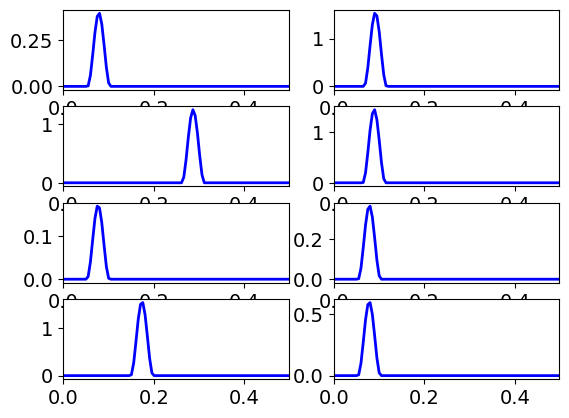

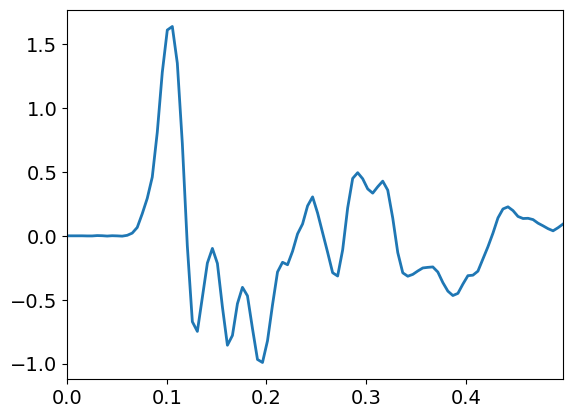

[0.10050251 0.15577889 0.24623116 0.29648241]
[20, 31, 49, 59]
minimum angle, maximum angle :  5.729577951308233e-09 320.40661410538775
max ang. vel of center block :  395.4696704532161


/tmp/ipykernel_2929764/1376628840.py:112: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


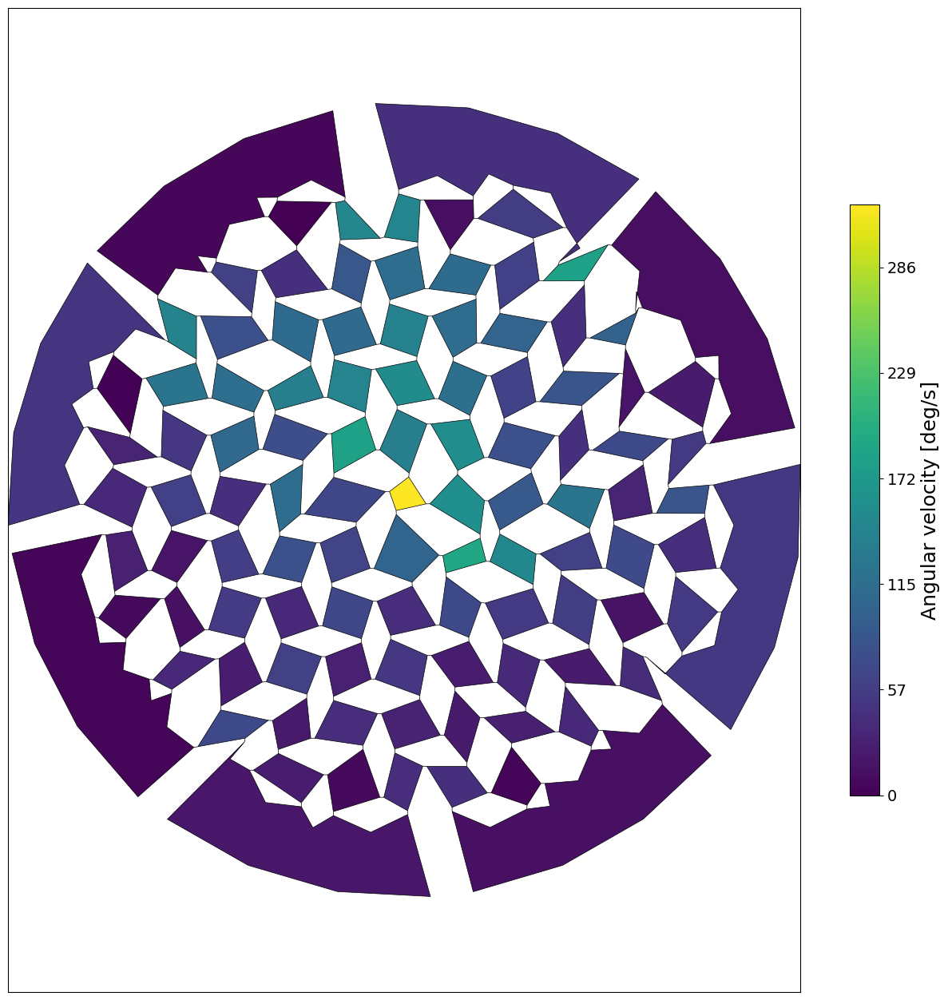

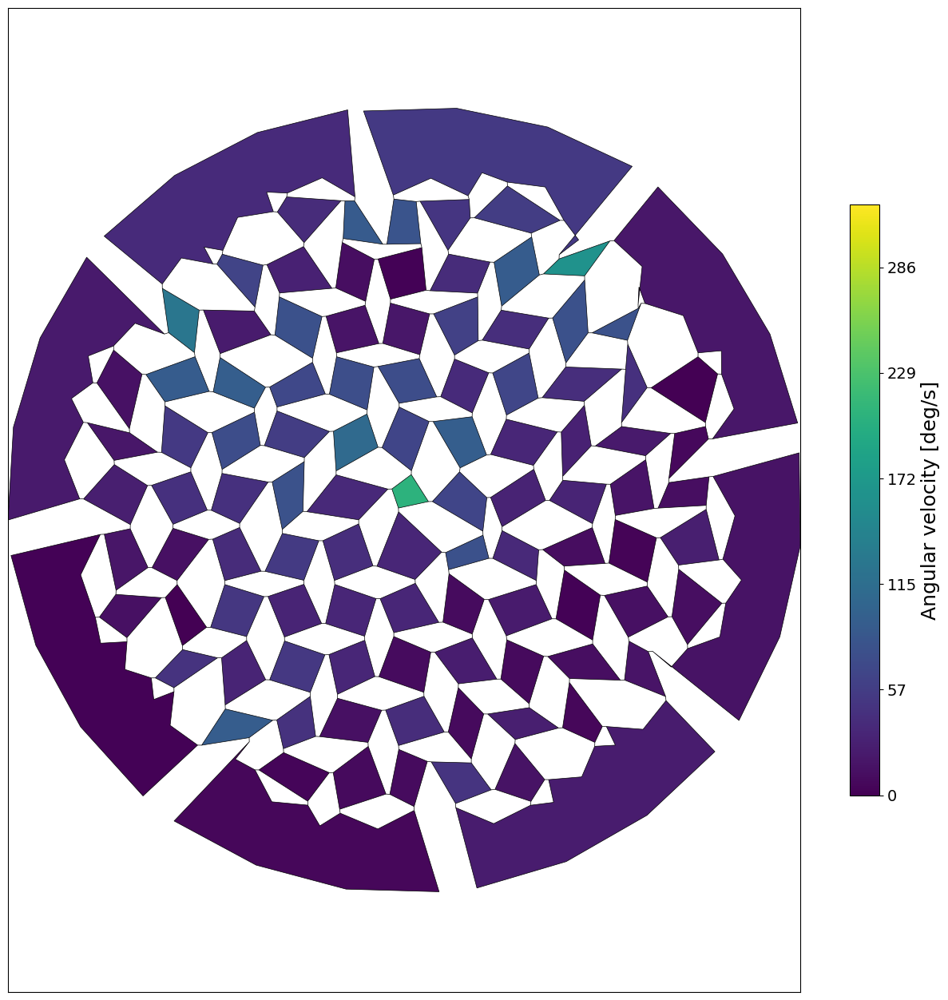

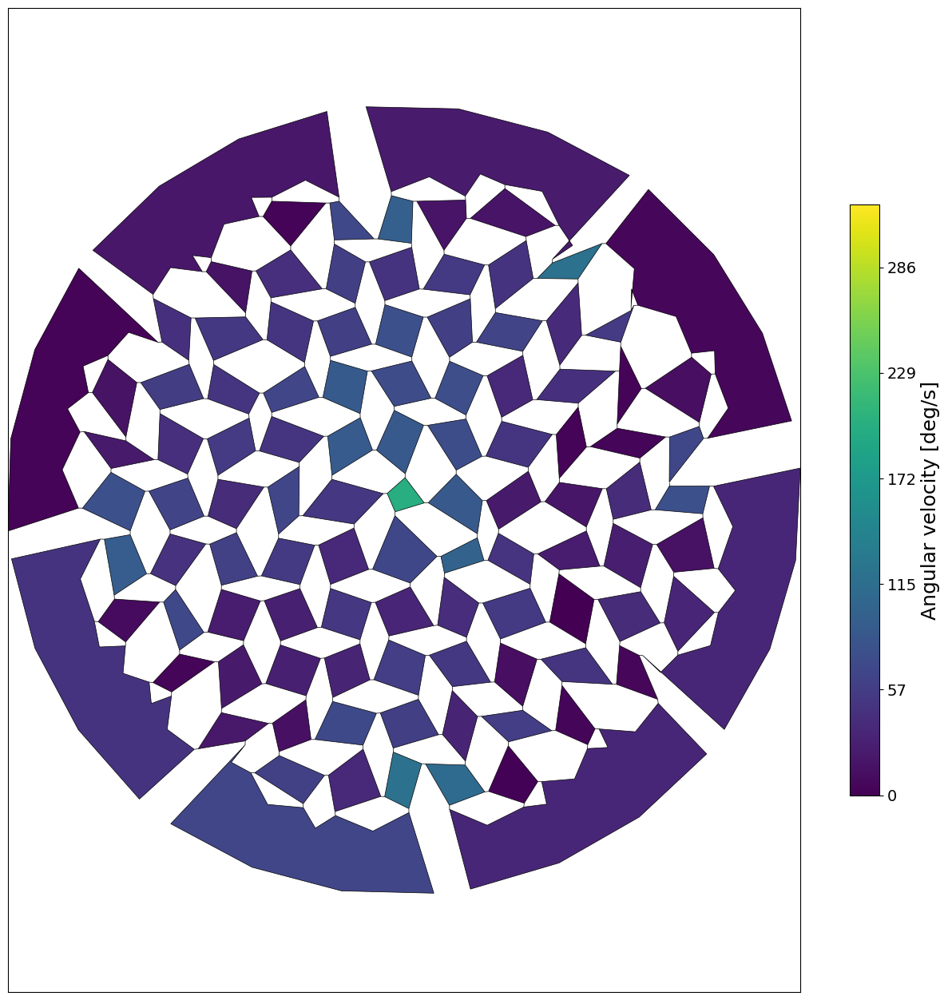

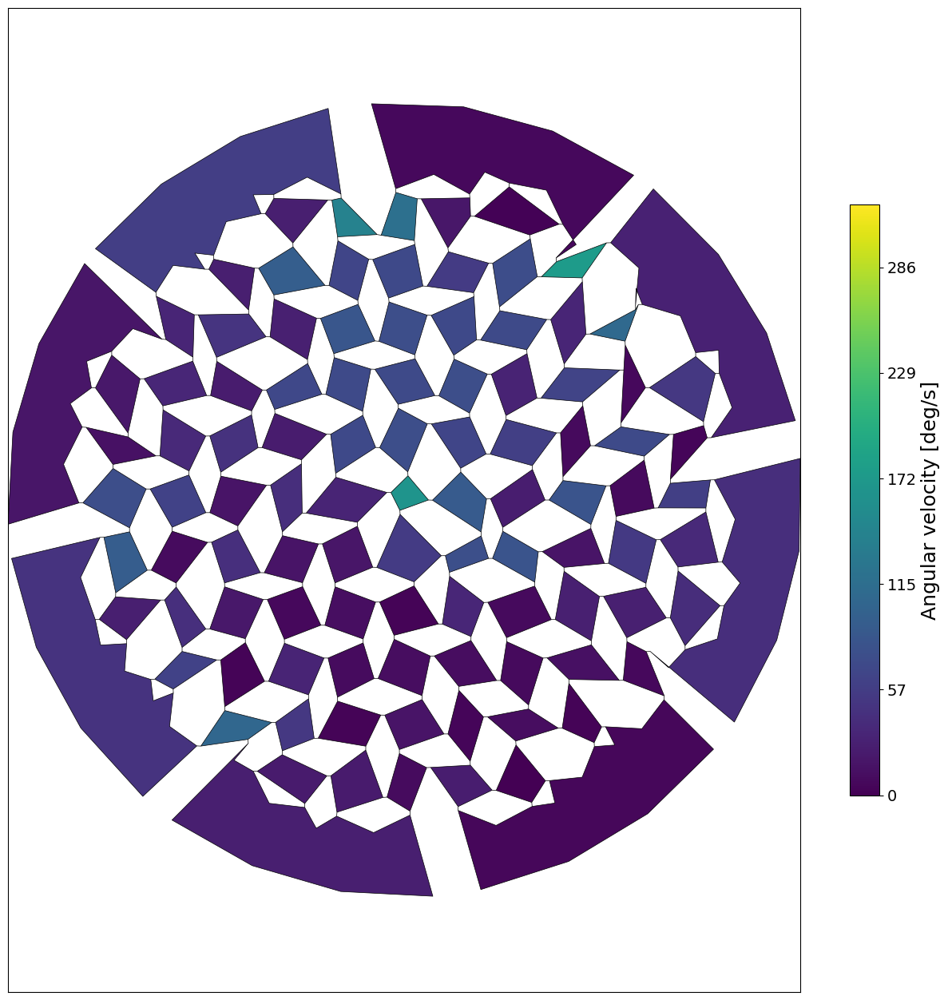

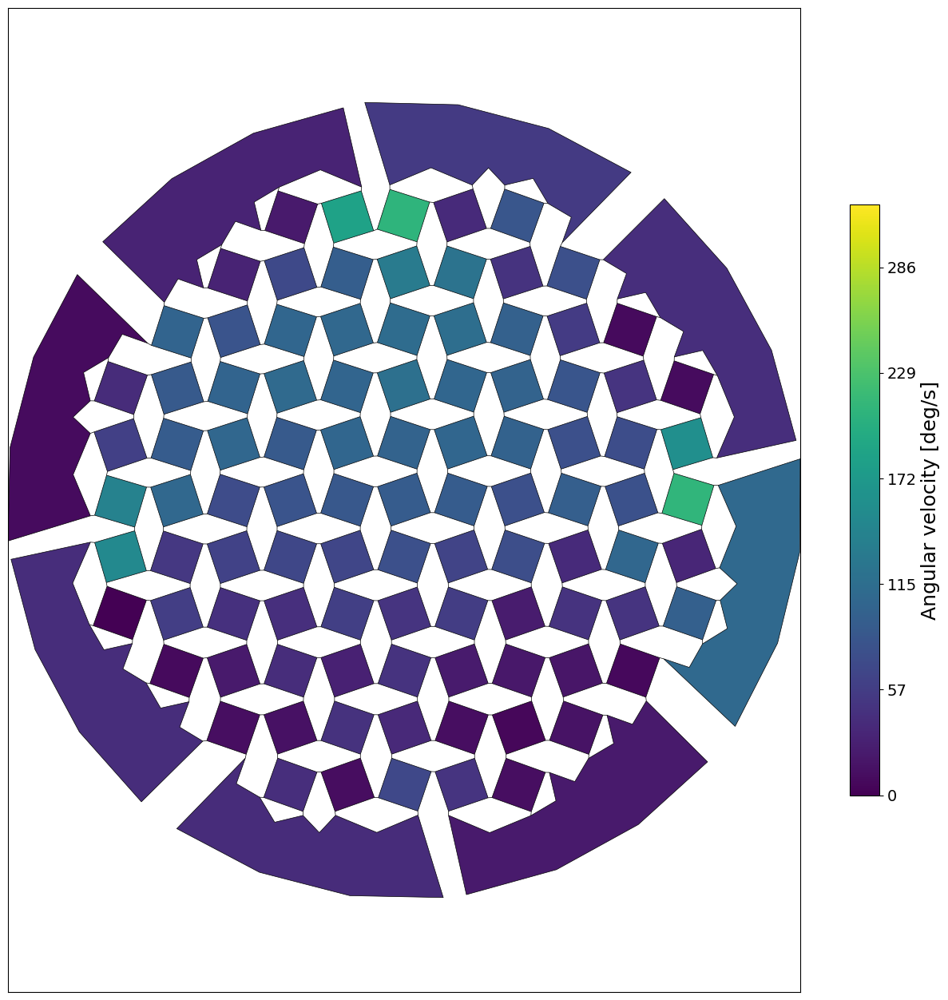

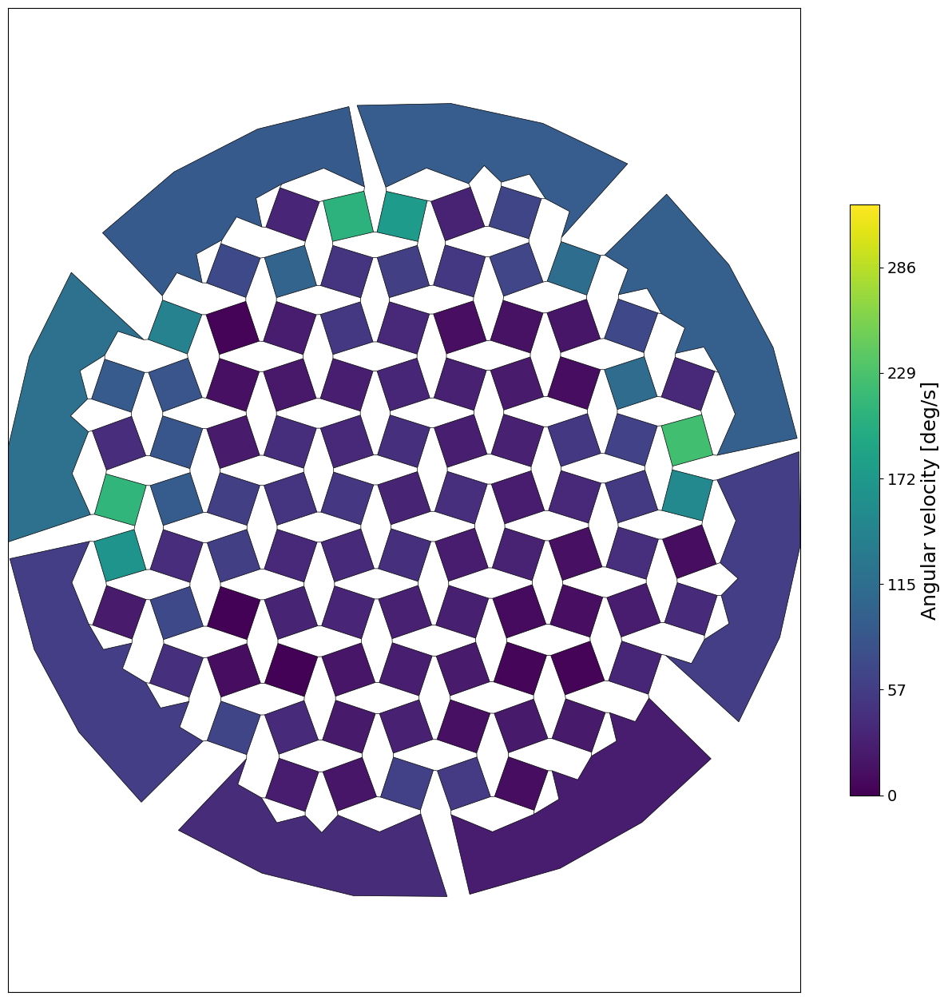

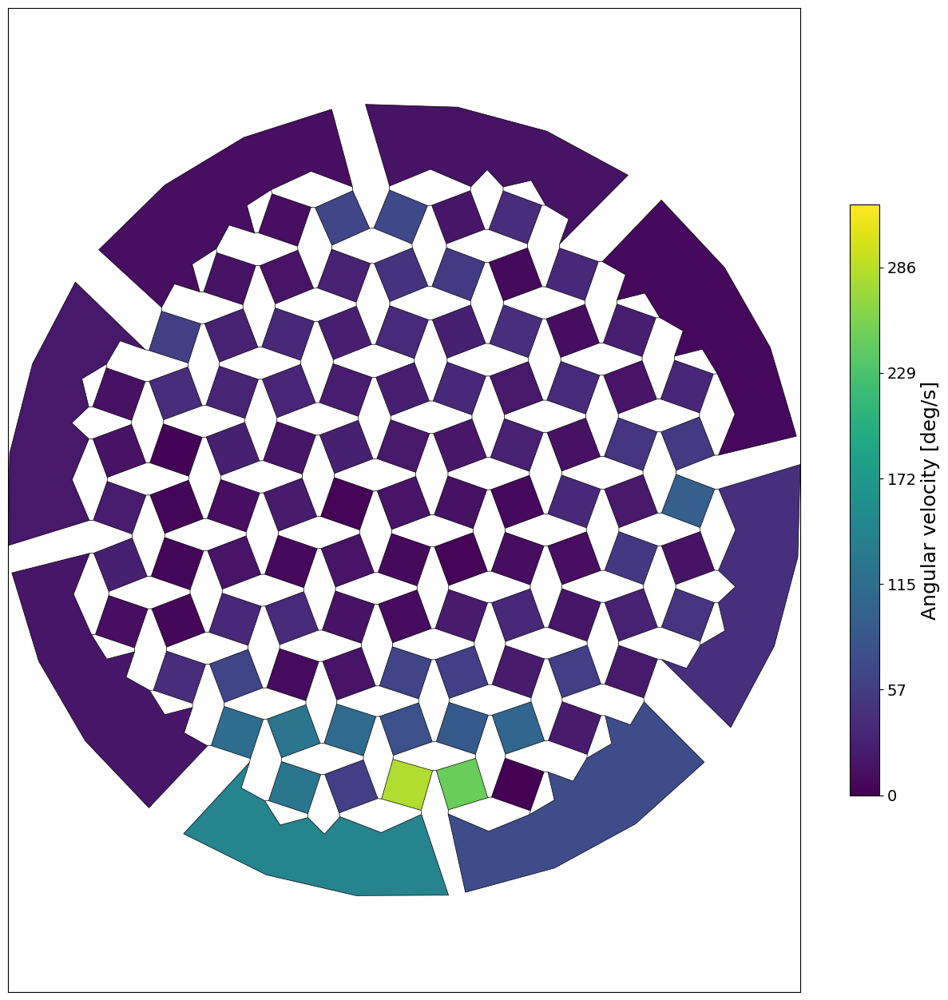

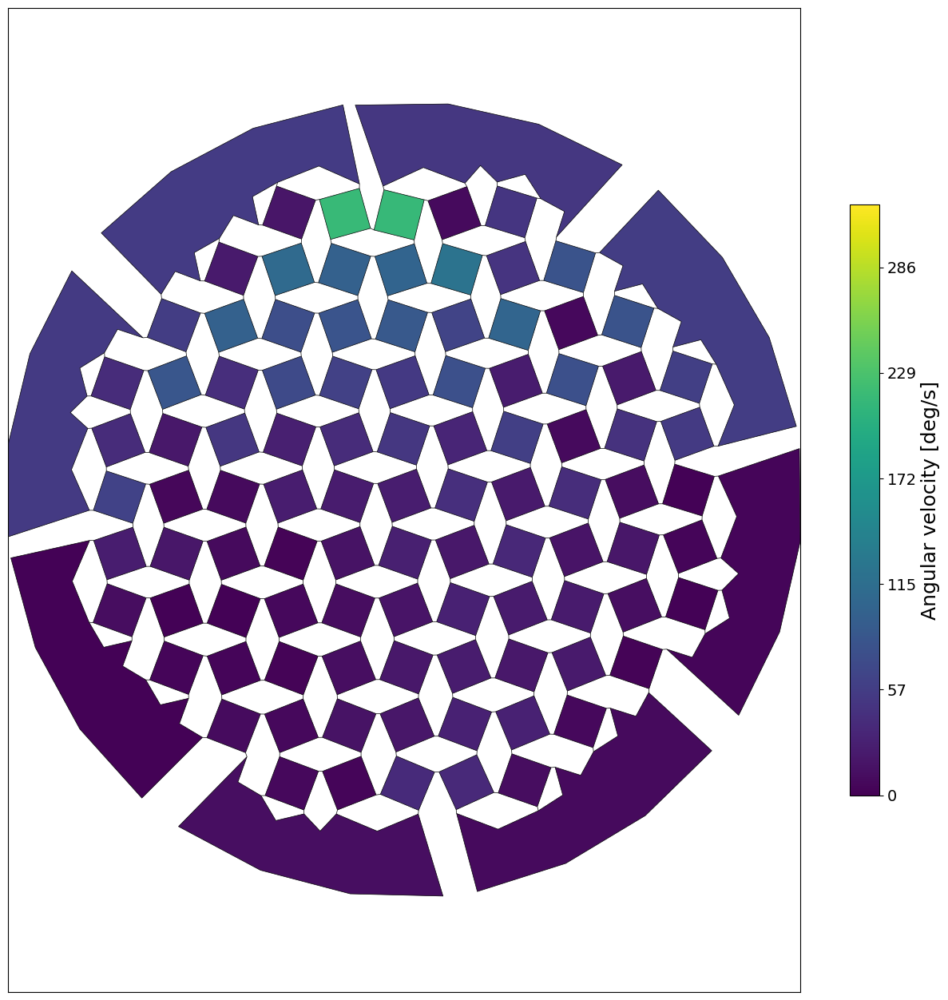

In [40]:
from blockymetamaterials.plotting_input import plot_geometry, compute_xy_limits

key = random.PRNGKey(0)
test_N = 30 # 10 % of total data will be used as test data
test_idx = jax.random.randint(key, shape=(test_N,), minval=0, maxval=300)
mask = jnp.ones(300, dtype=bool).at[test_idx].set(False)

with open(f"012326_circular_structure_dataset_n_source_8_exp_param_free_set_4.pickle", "rb") as f:
    results_dict = pickle.load(f)
    input_data = results_dict["input_data"]
    output_data = results_dict["output_data"]

with open(f"01302026_simulation_results_n_source_16_measure_idx_48_exp_param_set_4_lr_0.1.pickle", "rb") as f:
    results_dict_opt = pickle.load(f)
    input_data_opt = results_dict_opt["input_data"]
    output_data_opt = results_dict_opt["output_data"]

simulation_time = 1.0
n_timepoints = 200
ts = jnp.linspace(0, simulation_time, n_timepoints)

horizontal_shifts, vertical_shifts = QuadGeometry_Circle_InputSource(n1_blocks, n2_blocks, spacing=spacing, bond_length=hinge_length, n_piece=n_piece).get_design_from_rotated_square(
    angle=initial_angle,
)  # Initial design

horizontal_shifts_opt = results_dict_opt["horizontal_shifts"]
vertical_shifts_opt = results_dict_opt["vertical_shifts"]

x_max = jnp.max( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,0], results_dict["input_data"][:,:,0,:,0]], axis=0 ) )
x_min = jnp.min( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,0], results_dict["input_data"][:,:,0,:,0]], axis=0 ) )
y_max = jnp.max( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,1], results_dict["input_data"][:,:,0,:,1]], axis=0 ) )
y_min = jnp.min( jnp.concatenate( [results_dict_opt["input_data"][:,:,0,:,1], results_dict["input_data"][:,:,0,:,1]], axis=0 ) )


from blockymetamaterials.plotting_input import generate_animation, compute_xy_limits

design_values = (horizontal_shifts, vertical_shifts)
block_centroids_temp = block_centroids(horizontal_shifts, vertical_shifts)
centroid_node_vectors_temp = centroid_node_vectors(horizontal_shifts, vertical_shifts)
shell_verts = jnp.concatenate([ centroids + vertices for centroids, vertices in zip(block_centroids_temp, centroid_node_vectors_temp)], axis=0)
xlim_structure, ylim_structure = compute_xy_limits(shell_verts) + 0.5*geometry.spacing * jnp.array([-1, 1])

block_centroids_opt_temp = block_centroids(horizontal_shifts_opt, vertical_shifts_opt)
centroid_node_vectors_opt_temp = centroid_node_vectors(horizontal_shifts_opt, vertical_shifts_opt)

x_lim = jnp.array([xlim_structure[0] + x_min, xlim_structure[1] + x_max])
y_lim = jnp.array([ylim_structure[0] + y_min, ylim_structure[1] + y_max])



# step_set = jnp.arange(10)
# step_set = jnp.arange(10,120,10)
# step_set = [80]
# colors_list = ["b" for _ in range(geometry.n_blocks)]
# colors_list_opt = ["r" for _ in range(geometry.n_blocks)]
# colors_list[48] = "g"
# colors_list_opt[48] = "g"   

import matplotlib.cm as cm

num = 26 # number of test data
R2D = 180. / jnp.pi

test_input_data = input_data[test_idx]
test_output_data = output_data[test_idx]
test_input_data_opt = input_data_opt[test_idx]
test_output_data_opt = output_data_opt[test_idx]
step_set = []

N = 100
for j in range(n_piece):
    plt.subplot(n_piece // 2, 2, 1 + j)
    plt.plot(ts[:N], -test_output_data[num, :N, j], "b-", label="True")
    # Find the index of the peak (maximum value)
    peak_idx = jnp.argmax(-test_output_data[num, :N, j])
    print(peak_idx)
    step_set.append(peak_idx)
plt.show()

plt.plot( ts[:N], -test_input_data[num, :N, 1, 48, 2] )
plt.show()

step_set = jnp.array(step_set)
step_set = jnp.unique(step_set).sort()
step_set = [20, 31, 49, 59]
print(ts[jnp.array(step_set)])
print(step_set)


# Compute velocity magnitudes
vel =  jnp.abs( jnp.concatenate( [test_input_data[num,:,1,:,2], test_input_data[num,:,1,:,2]], axis=0 ) )
vel_mag = jnp.abs(test_input_data[num,:,1,:,2])
vel_mag_opt = jnp.abs(test_input_data_opt[num,:,1,:,2])
vmin = float(vel.min())
vmax = float(vel.max())

print( "minimum angle, maximum angle : ", vmin * R2D, vmax * R2D )
print( "max ang. vel of center block : ", jnp.max(jnp.abs(test_input_data_opt[num,:,1,48,2])) * R2D )
# Normalize and map to inferno colormap
norm_vel_mag_opt = (vel_mag_opt - vmin) / (vmax - vmin + 1e-12)
norm_vel_mag = (vel_mag - vmin) / (vmax - vmin + 1e-12)

ts = jnp.linspace(0,simulation_time,n_timepoints)
label_list = ["Accel x", "Accel y", "Angular vel"]

ylim_accel = jnp.array([-3500, 3500])
ylim_vel = jnp.array([-360,360])

target_idx = 48

from matplotlib.colors import Normalize
cmap = cm.get_cmap('viridis')
# cmap = cm.get_cmap('GnBu')
# ScalarMappable for colorbar (angular velocity in rad/s, display in deg/s)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])

# The shape is (steps, n_blocks), so convert each step's colors to RGBA
colormap_vel_opt = [cmap(norm_vel_mag_opt[step]) for step in range(norm_vel_mag_opt.shape[0])]
colormap_vel = [cmap(norm_vel_mag[step]) for step in range(norm_vel_mag.shape[0])]

# fig, ax = plt.subplots(figsize=(16,16))
for step in step_set:
    fig, ax = plt.subplots(figsize=(16,16))
    plot_geometry(block_centroids_opt_temp,
                centroid_node_vectors_opt_temp,
                _bond_connectivity,
                block_displacements=test_input_data_opt[num,step,0,:,:],
                deformed=True, xlim=x_lim, ylim=y_lim,
                color=colormap_vel_opt[step], ax=ax)
    ax.axis("equal")
    ax.set_yticks([]) 
    ax.set_xticks([])
    # ax.axis("off")
    ax.grid(False)
    cbar = fig.colorbar(sm, ax=ax, shrink=0.6)
    # cbar.set_label("Angle [deg]")
    cbar.set_label("Angular velocity [deg/s]")
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x*R2D:.0f}"))
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_test_num_{num}_step_{step}_box_viridis_vel.eps")
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_test_num_{num}_step_{step}_box_viridis_vel.png")
    plt.show()
# ax.axis("equal")
# ax.grid(False)
# ax.axis("off")
# cbar = fig.colorbar(sm, ax=ax, shrink=0.6)
# cbar.set_label("Angle [deg]")
# cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x*R2D:.0f}"))
# plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_all_step_5.eps")
# plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_all_step_5.png")
# plt.show()

    # plt.figure(figsize=(12,3))
    # plt.plot( ts, input_data[num,:, 1, target_idx, j] * R2D, color="blue" )
    # for step in step_set:
    # plt.plot( ts[step], input_data[num, step, 1, target_idx, j] * R2D, color="blue", marker="*", markersize=10 )
    # plt.plot( ts, input_data_opt[num,:, 1, target_idx, j] * R2D, color="red" )
    # plt.plot( ts[step], input_data_opt[num, step, 1, target_idx, j] * R2D, color="red", marker="*", markersize=10 )
    # plt.ylim(ylim_vel)
    # plt.ylabel(label_list[2])
    # plt.suptitle(f"Data idx {num}")
    # plt.xlabel("Time [s]")
    # plt.tight_layout()
    # plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_step_{step}_ang_vel.eps")
    # plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_step_{step}_ang_vel.png")
    # plt.show()

# fig, ax = plt.subplots(figsize=(16,16))
for step in step_set:
    fig, ax = plt.subplots(figsize=(16,16))
    plot_geometry(block_centroids_temp,
                centroid_node_vectors_temp,
                _bond_connectivity,
                block_displacements=test_input_data[num,step,0,:,:],
                deformed=True, xlim=x_lim, ylim=y_lim,
                color=colormap_vel[step], ax=ax)
    ax.axis("equal")
    # ax.axis("off")
    ax.set_yticks([])
    ax.set_xticks([])
    ax.grid(False)
    cbar = fig.colorbar(sm, ax=ax, shrink=0.6)
    # cbar.set_label("Angle [deg]")
    cbar.set_label("Angular velocity [deg/s]")
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f"{x*R2D:.0f}"))
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_test_num_{num}_step_{step}_box_viridis_vel.eps")
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_test_num_{num}_step_{step}_box_viridis_vel.png")
    plt.show()
# plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_num_{num}_all_step_5.eps")
# plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_num_{num}_all_step_5.png")
# plt.show()


In [19]:
# jnp.array(colormap_vel_opt[step_set[0],48,:])

for step in step_set:
    print(test_input_data[num, step, 1, 48, 2] * R2D)
print("--------------")
for step in step_set:
    print(test_input_data_opt[num, step, 1, 48, 2] * R2D)

-9.909655847540897
-16.80644500276938
-46.42017432366681
23.086450537638314
-25.727770181981054
--------------
-59.27974178661983
-120.16263588031288
-297.4905939069116
-59.39395630503333
-81.00417696645214


Peak indices: [ 1  5 11 31 49 72 79 86]


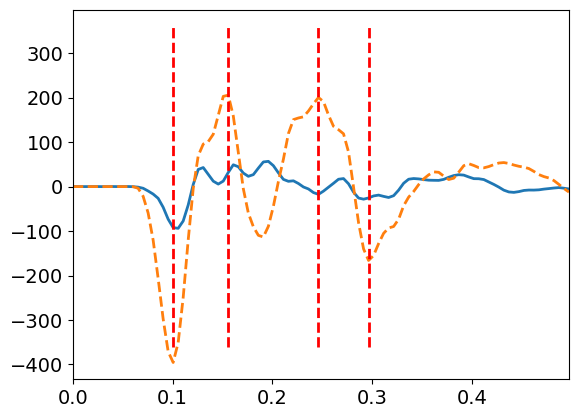

In [33]:
from scipy.signal import find_peaks

# Find indices of peaks in the specified signal
signal = jnp.asarray(test_input_data_opt[num, :N, 1, 48, 2])
peaks, _ = find_peaks(signal)
print("Peak indices:", peaks)

step_set = [20, 31, 49, 59]
plt.plot( ts[:N], test_input_data[num, :N, 1, 48, 2] * R2D )
plt.plot( ts[:N], test_input_data_opt[num, :N, 1, 48, 2] * R2D,"--" )
for step in step_set:
    plt.vlines(ts[step], -360, 360, color="red", linestyle="--")
# for step in peaks:
#     plt.vlines(ts[step], -360, 360, color="blue", linestyle="--")
plt.show()

In [106]:
print( "max ang. vel of center block : ", jnp.max(jnp.abs(results_dict_opt["input_data"][num,:,1,48,2])) * R2D )

max ang. vel of center block :  419.89313869019526


In [102]:
print( "minimum angle, maximum angle : ", vmin * R2D, vmax * R2D )

minimum angle, maximum angle :  5.729577951308233e-09 419.89313869019526


In [51]:
num = 0
# Compute velocity magnitudes
vel =  jnp.concatenate( [results_dict_opt["input_data"][num,:,0,:,2], results_dict["input_data"][num,:,0,:,2]], axis=0 )
vel_mag = results_dict["input_data"][num,:,0,:,2]
vel_mag_opt = results_dict_opt["input_data"][num,:,0,:,2]
vmin = float(vel.min())
vmax = float(vel.max())
v_lim = jnp.array([vmin, vmax])
print(v_lim)

[-0.24537663  0.27166473]


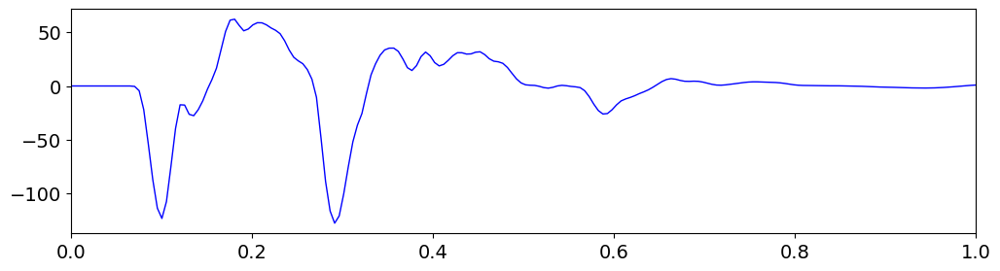

In [11]:
plt.figure(figsize=(12,3))
plt.plot( ts, input_data_opt[num,:, 1, target_idx, 2] * R2D, linewidth=1, color="blue" )
plt.show()

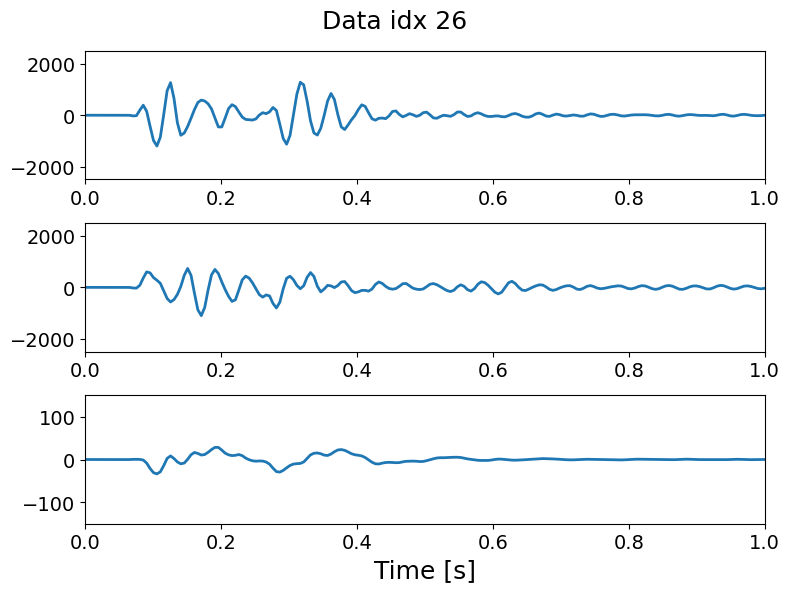

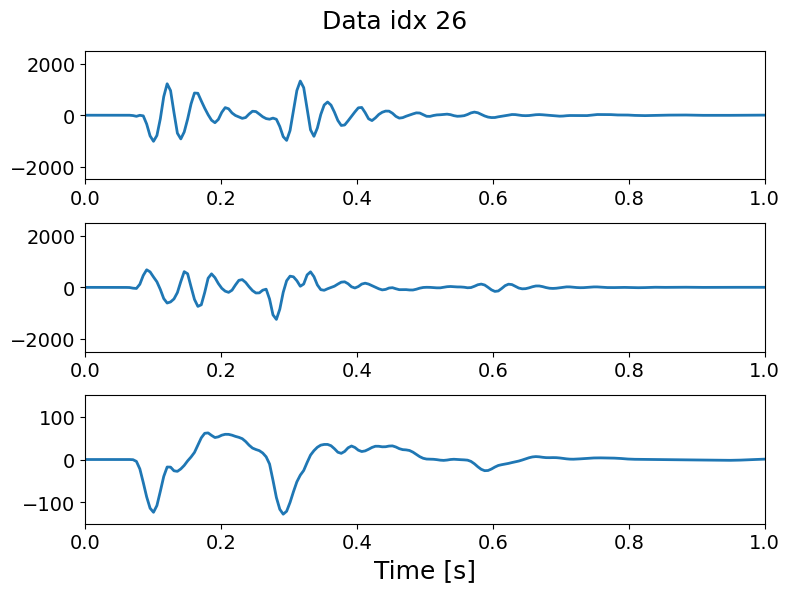

In [20]:
ts = jnp.linspace(0,simulation_time,n_timepoints)
label_list = ["Accel x", "Accel y", "Angular vel"]

ylim_accel = jnp.array([-2500, 2500])
R2D = 180. / jnp.pi
ylim_vel = jnp.array([-150,150])

target_idx = 48
for i in range(26,27):
    plt.figure(figsize=(8,6))
    for j in range(3):
        plt.subplot(3,1,j+1)
        if j < 2:
            plt.plot( ts, input_data[i,:, 2, target_idx, j])
            # plt.plot( ts, input_data_opt[i,:, 2, target_idx, j])
            plt.ylim(ylim_accel)
        else:
            plt.plot( ts, input_data[i,:, 1, target_idx, j] * R2D)
            # plt.plot( ts, input_data_opt[i,:, 1, target_idx, j] * R2D)
            plt.ylim(ylim_vel)
        # plt.ylabel(label_list[j])
    plt.suptitle(f"Data idx {i}")
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_num_{i}_measurement_data.eps")
    plt.show()

for i in range(26,27):
    plt.figure(figsize=(8,6))
    for j in range(3):
        plt.subplot(3,1,j+1)
        if j < 2:
            # plt.plot( ts, input_data[i,:, 2, target_idx, j])
            plt.plot( ts, input_data_opt[i,:, 2, target_idx, j])
            plt.ylim(ylim_accel)
        else:
            # plt.plot( ts, input_data[i,:, 1, target_idx, j] * R2D)
            plt.plot( ts, input_data_opt[i,:, 1, target_idx, j] * R2D)
            plt.ylim(ylim_vel)
        # plt.ylabel(label_list[j])
    plt.suptitle(f"Data idx {i}")
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{i}_measurement_data.eps")
    plt.show()

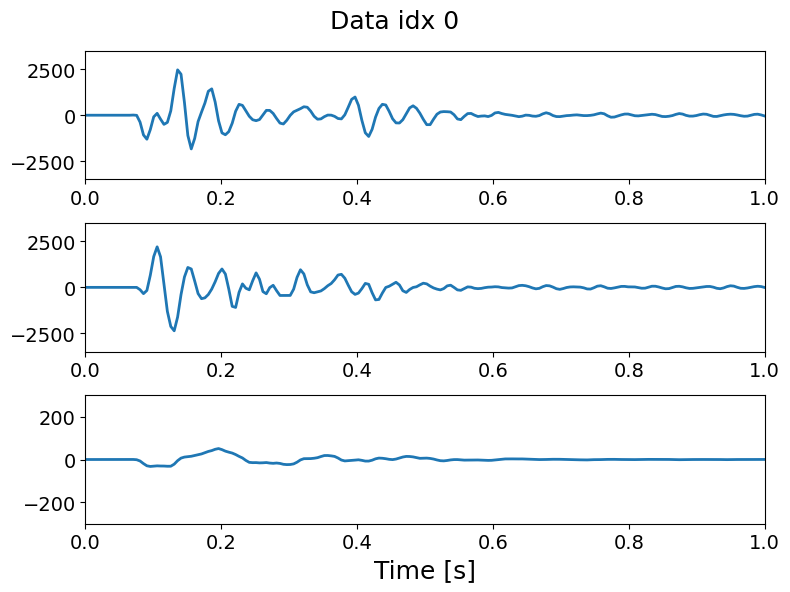

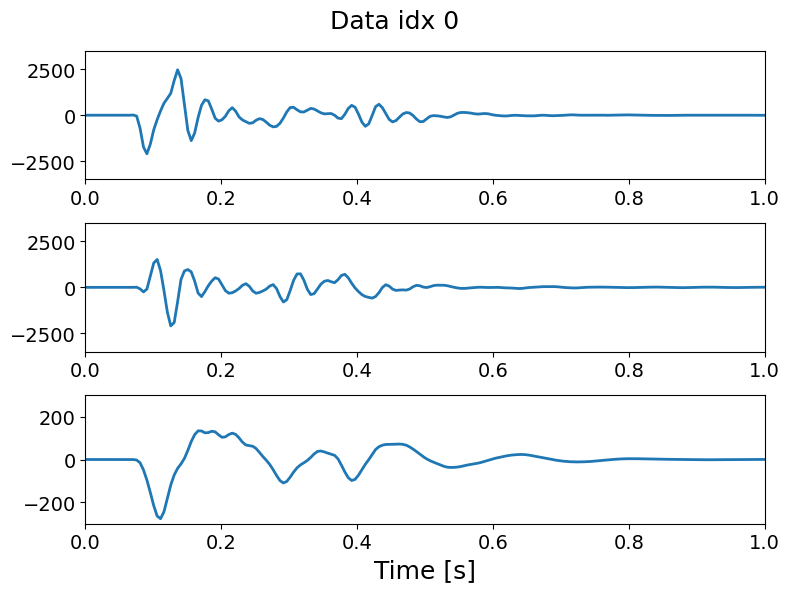

In [ ]:
ts = jnp.linspace(0,simulation_time,n_timepoints)
label_list = ["Accel x", "Accel y", "Angular vel"]

ylim_accel = jnp.array([-3500, 3500])
R2D = 180. / jnp.pi
ylim_vel = jnp.array([-300,300])

target_idx = 48
for i in range(1):
    plt.figure(figsize=(8,6))
    for j in range(3):
        plt.subplot(3,1,j+1)
        if j < 2:
            plt.plot( ts, input_data[i,:, 2, target_idx, j])
            # plt.plot( ts, input_data_opt[i,:, 2, target_idx, j])
            plt.ylim(ylim_accel)
        else:
            plt.plot( ts, input_data[i,:, 1, target_idx, j] * R2D)
            # plt.plot( ts, input_data_opt[i,:, 1, target_idx, j] * R2D)
            plt.ylim(ylim_vel)
        # plt.ylabel(label_list[j])
    plt.suptitle(f"Data idx {i}")
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_num_{i}_measurement_data.eps")
    plt.show()

for i in range(1):
    plt.figure(figsize=(8,6))
    for j in range(3):
        plt.subplot(3,1,j+1)
        if j < 2:
            # plt.plot( ts, input_data[i,:, 2, target_idx, j])
            plt.plot( ts, input_data_opt[i,:, 2, target_idx, j])
            plt.ylim(ylim_accel)
        else:
            # plt.plot( ts, input_data[i,:, 1, target_idx, j] * R2D)
            plt.plot( ts, input_data_opt[i,:, 1, target_idx, j] * R2D)
            plt.ylim(ylim_vel)
        # plt.ylabel(label_list[j])
    plt.suptitle(f"Data idx {i}")
    plt.xlabel("Time [s]")
    plt.tight_layout()
    plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{i}_measurement_data.eps")
    plt.show()

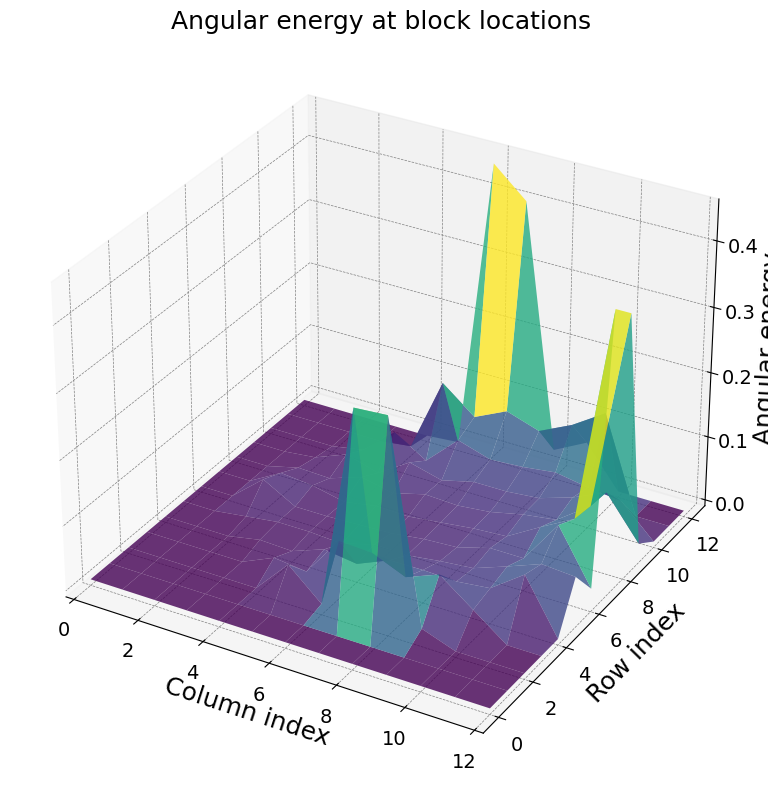

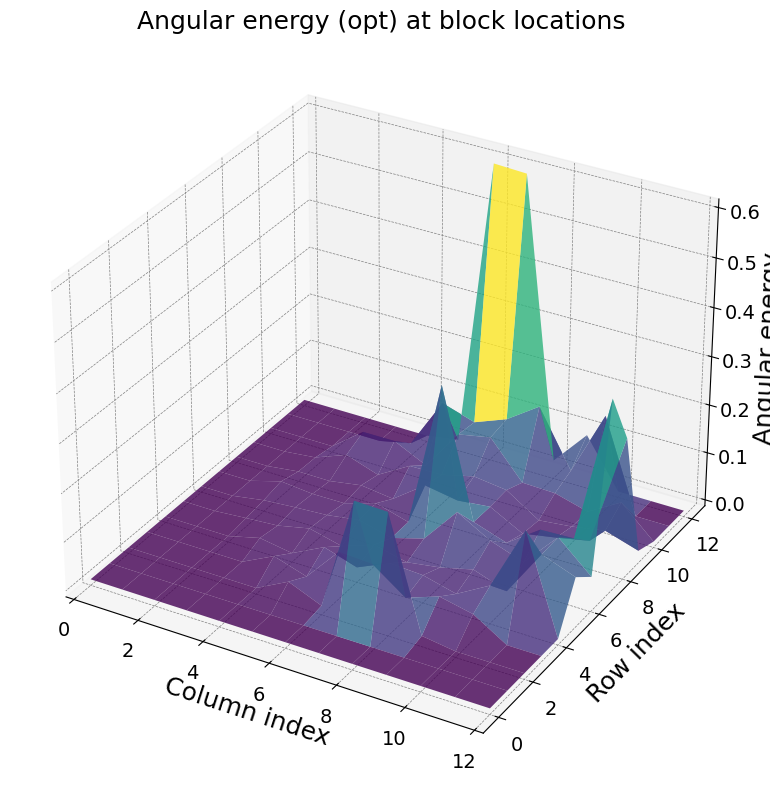

In [54]:
# Visualize ang_energy at loc_block in a 3D surface plot

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

block_num = loc_block.shape[1]
# Grid indices and ang_energy only at interior blocks
x_loc = np.asarray(loc_block[1])   # column index
y_loc = np.asarray(loc_block[0])   # row index
z_energy = np.asarray(ang_energy[:block_num])
z_energy_opt = np.asarray(ang_energy_opt[:block_num])

# Full grid: fill 0.0 where no block, ang_energy at block locations
n_rows, n_cols = int(loc_block[0].max()) + 1, int(loc_block[1].max()) + 1
X_grid, Y_grid = np.meshgrid(np.arange(n_cols), np.arange(n_rows))
Z_grid = np.zeros((n_rows, n_cols))
Z_grid_opt = np.zeros((n_rows, n_cols))
for k in range(block_num):
    Z_grid[y_loc[k], x_loc[k]] = z_energy[k]
    Z_grid_opt[y_loc[k], x_loc[k]] = z_energy_opt[k]

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(X_grid, Y_grid, Z_grid, cmap="viridis", edgecolor="none", alpha=0.8)
ax.set_xlabel("Column index")
ax.set_ylabel("Row index")
ax.set_zlabel("Angular energy")
ax.set_title("Angular energy at block locations")
plt.tight_layout()
plt.show()

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(X_grid, Y_grid, Z_grid_opt, cmap="viridis", edgecolor="none", alpha=0.8)
ax.set_xlabel("Column index")
ax.set_ylabel("Row index")
ax.set_zlabel("Angular energy")
ax.set_title("Angular energy (opt) at block locations")
plt.tight_layout()
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


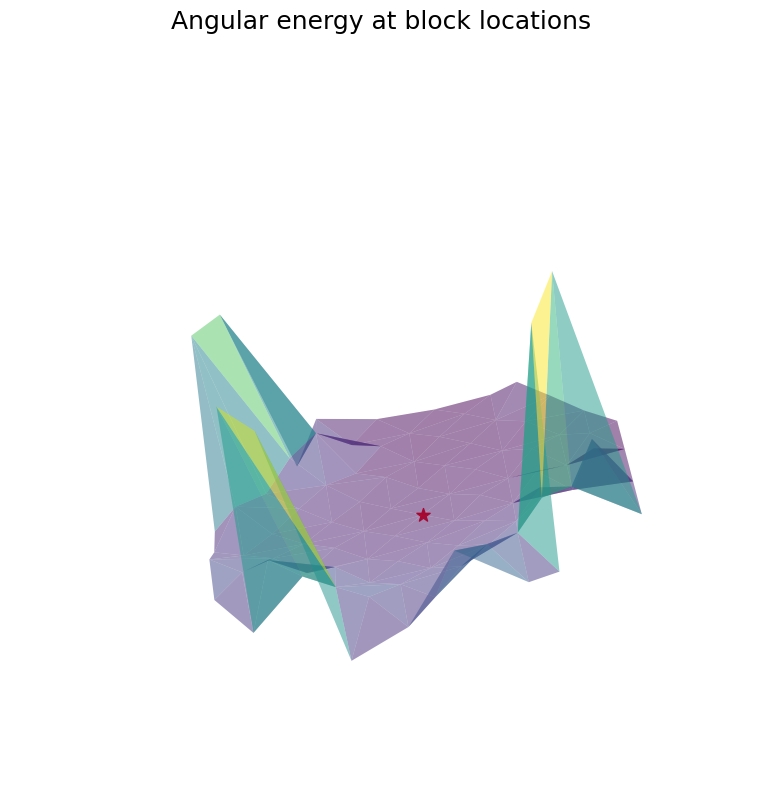

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


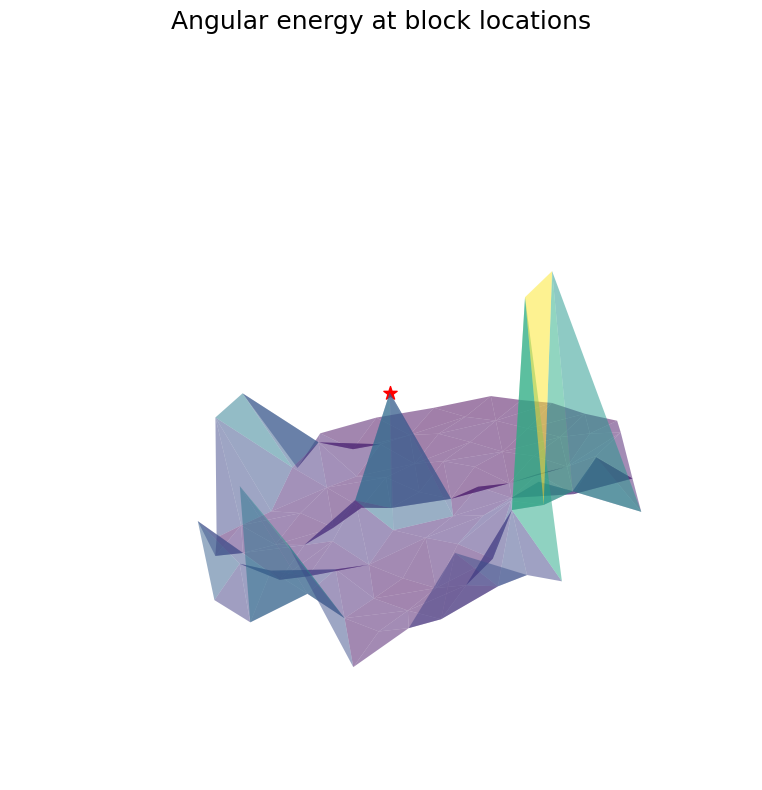

In [64]:
loc_block = jnp.stack( [geometry.blocks_inside // 15, geometry.blocks_inside % 15], axis=0 )

num = 26
ang_energy =  vmap(jnp.trapezoid, in_axes=(1,None,None))( input_data[num,:, 1, :, 2]**2,ts, ts[1]-ts[0] )
ang_energy_opt = vmap(jnp.trapezoid, in_axes=(1,None,None))( input_data_opt[num,:, 1, :, 2]**2,ts, ts[1]-ts[0] )


# Visualize ang_energy at loc_block in a 3D surface plot

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

block_num = loc_block.shape[1]
# Grid indices and ang_energy only at interior blocks
x_loc = np.asarray(loc_block[1])   # column index
y_loc = np.asarray(loc_block[0])   # row index
z_energy = ang_energy[:block_num]
z_energy_opt = ang_energy_opt[:block_num]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")
ax.plot_trisurf(x_loc, y_loc, z_energy, cmap="viridis", edgecolor="none", alpha=0.5)
ax.scatter(7, 7, z_energy[48], color="red", marker="*", s=100)
ax.set_xlabel("Column index")
ax.set_ylabel("Row index")
ax.set_zlabel("Angular energy")
ax.set_title("Angular energy at block locations")
plt.tight_layout()
ax.view_init(elev=30, azim=45, roll=15)
plt.axis("off")
plt.savefig(f"Figure/Circular_structure/circular_structure_design_init_design_data_num_{num}_ang_energy_without_axis.eps")
plt.show()

x_loc = np.asarray(loc_block[1])   # column index
y_loc = np.asarray(loc_block[0])   # row index
z_energy = ang_energy[:block_num]
z_energy_opt = ang_energy_opt[:block_num]
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")
ax.plot_trisurf(x_loc, y_loc, z_energy_opt, cmap="viridis", edgecolor="none", alpha=0.5)
ax.scatter(7, 7, z_energy_opt[48], color="red", marker="*", s=100)

ax.set_xlabel("Column index")
ax.set_ylabel("Row index")
ax.set_zlabel("Angular energy")
ax.set_title("Angular energy at block locations")
plt.tight_layout()
ax.view_init(elev=30, azim=45, roll=15)
plt.axis("off")
plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_ang_energy_without_axis.eps")
plt.show()

In [59]:
print( 48//15, 48%15 )

3 3


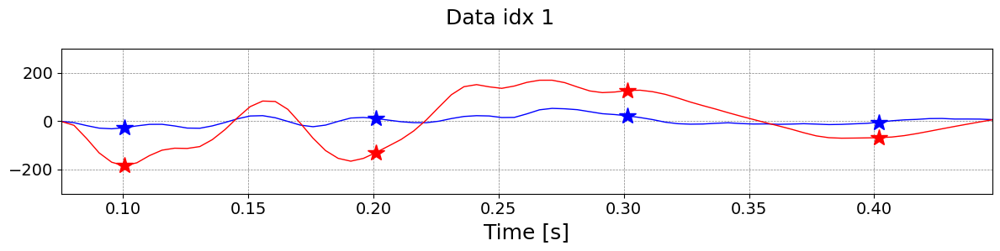

In [111]:
num = 1
j = 2
step_set = jnp.arange(20,100,20)
N=step_set[-1]+10
M=step_set[0]-5
plt.figure(figsize=(12,3))
plt.plot( ts[M:N], input_data[num,M:N, 1, target_idx, j] * R2D, linewidth=1, color="blue" )
for step in step_set:
    plt.plot( ts[step], input_data[num, step, 1, target_idx, j] * R2D, color="blue", marker="*", markersize=15)
plt.plot( ts[M:N], input_data_opt[num,M:N, 1, target_idx, j] * R2D, linewidth=1, color="red" )
for step in step_set:
    plt.plot( ts[step], input_data_opt[num, step, 1, target_idx, j] * R2D, color="red", marker="*", markersize=15 )
plt.ylim([-300.,300.])
plt.suptitle(f"Data idx {num}")
plt.xlabel("Time [s]")
plt.tight_layout()
plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_ang_vel.eps")
plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_ang_vel.png")
plt.show()

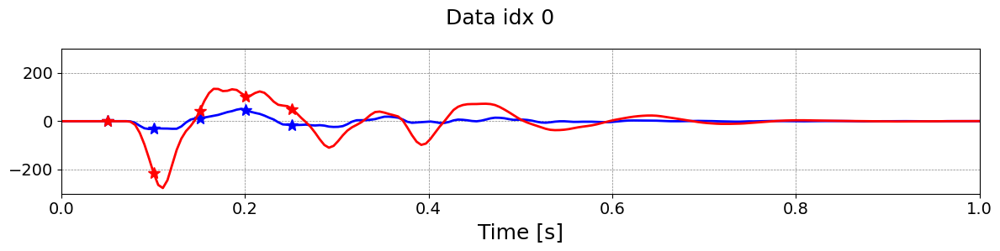

In [ ]:
plt.figure(figsize=(12,3))
plt.plot( ts, input_data[num,:, 1, target_idx, j] * R2D, color="blue" )
for step in step_set[1:]:
    plt.plot( ts[step], input_data[num, step, 1, target_idx, j] * R2D, color="blue", marker="*", markersize=10 )
plt.plot( ts, input_data_opt[num,:, 1, target_idx, j] * R2D, color="red" )
for step in step_set[1:]:
    plt.plot( ts[step], input_data_opt[num, step, 1, target_idx, j] * R2D, color="red", marker="*", markersize=10 )
plt.ylim([-300.,300.])
plt.suptitle(f"Data idx {num}")
plt.xlabel("Time [s]")
plt.tight_layout()
plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_ang_vel.eps")
plt.savefig(f"Figure/Circular_structure/circular_structure_design_opt_design_data_num_{num}_ang_vel.png")
plt.show()

In [ ]:
num = 1
# Compute velocity magnitudes
vel =  jnp.concatenate( [results_dict_opt["input_data"][num,:,0,:,2], results_dict["input_data"][num,:,0,:,2]], axis=0 )
vel_mag = results_dict["input_data"][num,:,0,:,2]
vel_mag_opt = results_dict_opt["input_data"][num,:,0,:,2]
vmin = float(vel.min())
vmax = float(vel.max())
v_lim = jnp.array([vmin, vmax]) * R2D
print(v_lim)

data = results_dict["input_data"][num,:,:,:,:]
data = data.at[:,0,:,2].set(data[:,0,:,2] * R2D)

solutionData = SolutionData(
    block_centroids=block_centroids_temp, #block_centroids(horizontal_shifts, vertical_shifts),
    centroid_node_vectors=centroid_node_vectors_temp, #centroid_node_vectors(horizontal_shifts, vertical_shifts),
    bond_connectivity=_bond_connectivity,
    timepoints=ts,
    fields=data
)

out_filename = f"Simulation/Circular_Structure/012326_circular_structure_dataset_n_source_8_exp_param_free_set_4_test_data_idx_{i}_angle_diff_colorbar"
start = time.time()
generate_animation(
    data=solutionData,
    field="theta",
    out_filename=out_filename,
    deformed=True,
    xlim=x_lim,
    ylim=y_lim,
    figsize=(8, 7.35*(geometry.n2_blocks)/geometry.n1_blocks),
    fontsize=14,
    fps=30,
    dpi=300,
    legend_label=None,#"Velocity [mm/s]",
    cmap="inferno",
    vlim=v_lim,
    axis=False
)
print("animation making time : ", time.time()-start)

data = results_dict_opt["input_data"][num,:,:,:,:]
data = data.at[:,0,:,2].set(data[:,0,:,2] * R2D)
solutionData = SolutionData(
    block_centroids=block_centroids_opt_temp,
    centroid_node_vectors=centroid_node_vectors_opt_temp,
    bond_connectivity=_bond_connectivity,
    timepoints=ts,
    fields=data
)

out_filename = f"Simulation/Circular_Structure/012326_circular_structure_dataset_n_source_8_exp_param_free_set_4_test_data_idx_{i}_opt_angle_diff_colorbar"
start = time.time()
generate_animation(
    data=solutionData,
    field="theta",
    out_filename=out_filename,
    deformed=True,
    xlim=x_lim,
    ylim=y_lim,
    figsize=(8, 7.35*(geometry.n2_blocks)/geometry.n1_blocks),
    fontsize=14,
    fps=30,
    dpi=300,
    legend_label=None, #"Velocity [mm/s]",
    cmap="inferno",
    vlim=v_lim,
    axis=False
)
print("animation making time : ", time.time()-start)

[-14.05904519  15.56524255]


Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  45.003443479537964


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y

animation making time :  44.907423973083496
